In [433]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [434]:
import numpy as np
import pandas as pd
from n0quater_stats import * 
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [435]:
os.chdir('/home/jules/smb4k/CRNLDATA/crnldata/cmo/multisite/DATA_MANIP/iEEG_Paris_J')

# PARAMS

In [436]:
savefig = False

In [437]:
folder_df = os.path.join(os.getcwd(), 'Analyses/results/allplot/df')
folder_df

'/home/jules/smb4k/CRNLDATA/crnldata/cmo/multisite/DATA_MANIP/iEEG_Paris_J/Analyses/results/allplot/df'

In [438]:
bandes = ['theta','alpha','beta','l_gamma','h_gamma','whole']

In [439]:
sujets_lyon = ['CHEe','GOBc','TREt','MAZm']
sujets = ['pat_03083_1527', 'pat_03105_1551', 'pat_03128_1591', 'pat_03138_1601']

# TF

In [476]:
os.chdir(folder_df)
df_TF_IE_all = pd.read_excel('allplot_df_TF.xlsx', index_col = 0).drop(columns = 'Unnamed: 0')
df_TF_IE_all = df_TF_IE_all.drop(['cond'], axis=1)


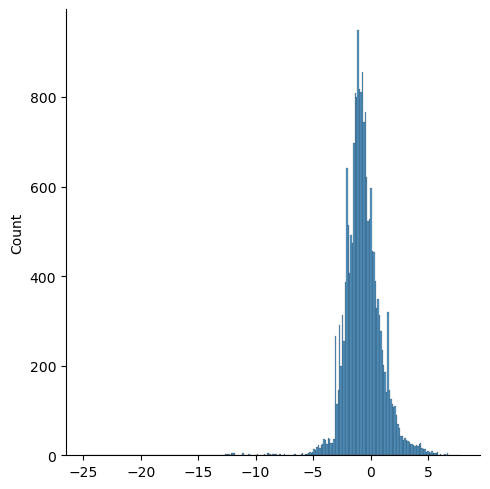

In [477]:
sns.displot(df_TF_IE_all['Pxx'].values)

In [478]:
predictors = ['band','phase']
outcome = 'Pxx'

In [479]:
df_TF_IE_all

,sujet,chan,ROI,Lobe,side,band,phase,Pxx
0,pat_03083_1527,AmT2_1,amygdala,Amygdala,l,theta,FR_CV_whole,0.107949
1,pat_03083_1527,AmT2_1,amygdala,Amygdala,l,theta,FR_CV_inspi,0.321491
2,pat_03083_1527,AmT2_1,amygdala,Amygdala,l,theta,FR_CV_expi,0.001812
3,pat_03083_1527,AmT2_1,amygdala,Amygdala,l,theta,FR_CV_IE,0.111654
4,pat_03083_1527,AmT2_1,amygdala,Amygdala,l,theta,FR_CV_EI,-0.223011
...,...,...,...,...,...,...,...,...
4111,pat_03138_1601,TPol_4,temporal sup,Temporal,l,l_gamma,AC_post,-2.881040
4112,pat_03138_1601,TPol_4,temporal sup,Temporal,l,h_gamma,AC_pre,-2.965796
4113,pat_03138_1601,TPol_4,temporal sup,Temporal,l,h_gamma,AC_resp_evnmt_1,-2.803920
4114,pat_03138_1601,TPol_4,temporal sup,Temporal,l,h_gamma,AC_resp_evnmt_2,-3.006995


In [446]:
df_pre, pre_signif, df_post_hocs, post_hocs_signif, conclusions = smart_stats(df_TF_IE_all, within = 'phase', seuil=0.05)

Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/home/jules/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3398, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/tmp/ipykernel_2929990/1191248185.py", line 1, in <cell line: 1>
    df_pre, pre_signif, df_post_hocs, post_hocs_signif, conclusions = smart_stats(df_TF_IE_all, within = 'phase', seuil=0.05)
  File "/home/jules/smb4k/CRNLDATA/crnldata/cmo/multisite/DATA_MANIP/iEEG_Paris_J/Script_Python_iEEG_Paris_git/n0quater_stats.py", line 697, in smart_stats
    df_pre, df_post_hocs = pre_and_post_hoc(df=df, within=within, seuil=seuil)
  File "/home/jules/smb4k/CRNLDATA/crnldata/cmo/multisite/DATA_MANIP/iEEG_Paris_J/Script_Python_iEEG_Paris_git/n0quater_stats.py", line 619, in pre_and_post_hoc
    normality, test_to_use = which_pre_test(df=df, dv = metric , grouping=within)
  File "/home/jules/smb4k/CRNLDATA/crnldata/cmo/multisite/DATA_MANIP/iEEG_Paris_J/Script_Python_iEEG_Paris_git/n0quate

In [480]:
df_TF_IE_all

,sujet,chan,ROI,Lobe,side,band,phase,Pxx
0,pat_03083_1527,AmT2_1,amygdala,Amygdala,l,theta,FR_CV_whole,0.107949
1,pat_03083_1527,AmT2_1,amygdala,Amygdala,l,theta,FR_CV_inspi,0.321491
2,pat_03083_1527,AmT2_1,amygdala,Amygdala,l,theta,FR_CV_expi,0.001812
3,pat_03083_1527,AmT2_1,amygdala,Amygdala,l,theta,FR_CV_IE,0.111654
4,pat_03083_1527,AmT2_1,amygdala,Amygdala,l,theta,FR_CV_EI,-0.223011
...,...,...,...,...,...,...,...,...
4111,pat_03138_1601,TPol_4,temporal sup,Temporal,l,l_gamma,AC_post,-2.881040
4112,pat_03138_1601,TPol_4,temporal sup,Temporal,l,h_gamma,AC_pre,-2.965796
4113,pat_03138_1601,TPol_4,temporal sup,Temporal,l,h_gamma,AC_resp_evnmt_1,-2.803920
4114,pat_03138_1601,TPol_4,temporal sup,Temporal,l,h_gamma,AC_resp_evnmt_2,-3.006995


theta
alpha
beta
l_gamma
h_gamma


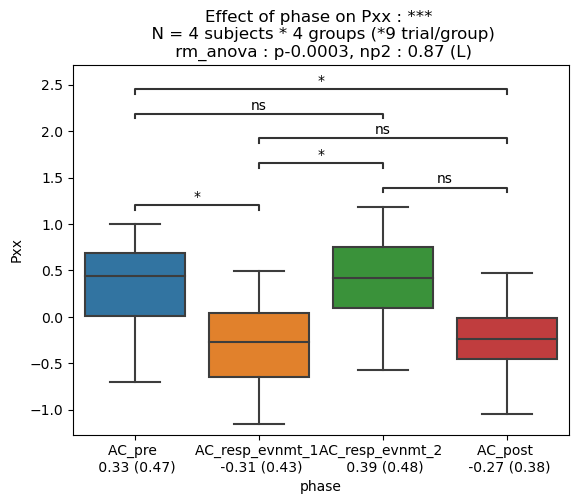

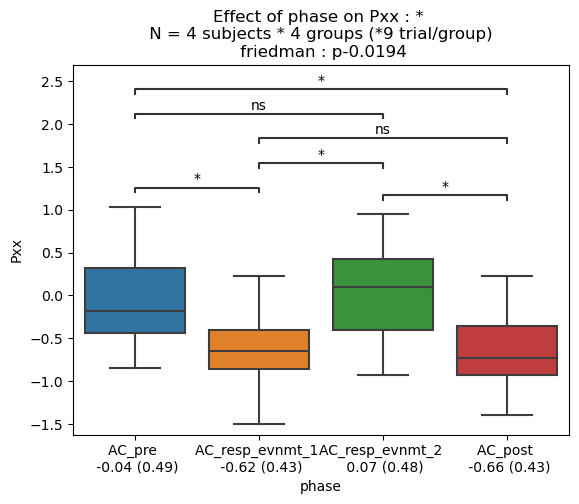

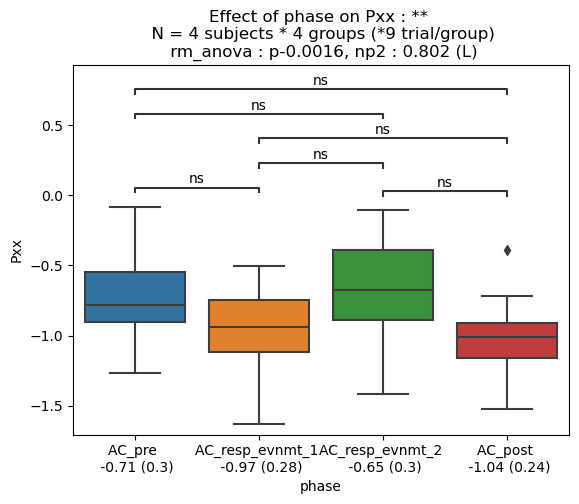

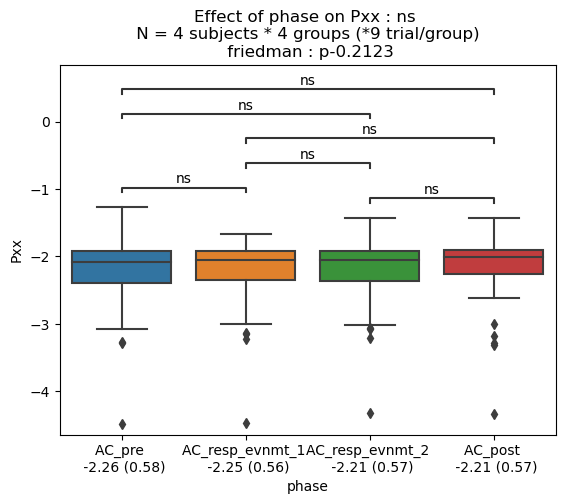

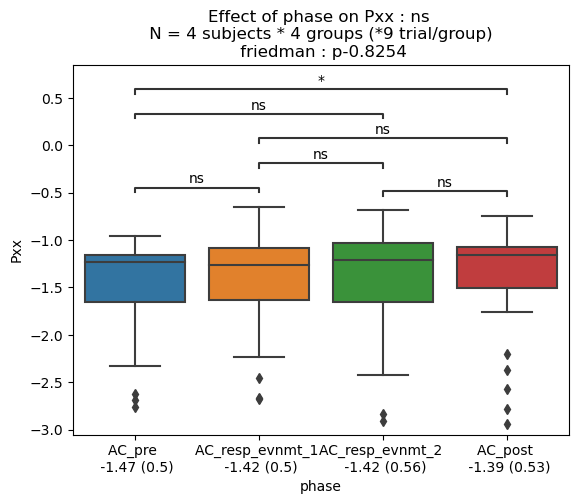

In [482]:
for band in df_TF_IE_all['band'].unique():
    if band == 'whole':
        continue
    print(band)
    df = df_TF_IE_all.query(f"band == '{band}' and phase in ['AC_pre','AC_resp_evnmt_1','AC_resp_evnmt_2','AC_post']").groupby(['sujet','phase','ROI']).mean().reset_index()
    auto_stats(df=df, predictor = 'phase', outcome = 'Pxx', subject = 'sujet', order = ['AC_pre','AC_resp_evnmt_1','AC_resp_evnmt_2','AC_post'])
# if savefig:
#     plt.savefig(folder + 'figures_stats/mean_pxx_by_cond', bbox_inches = 'tight')

theta
alpha
beta
l_gamma
h_gamma


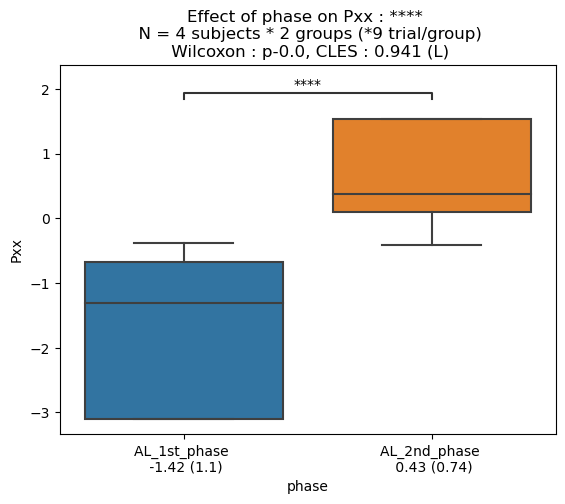

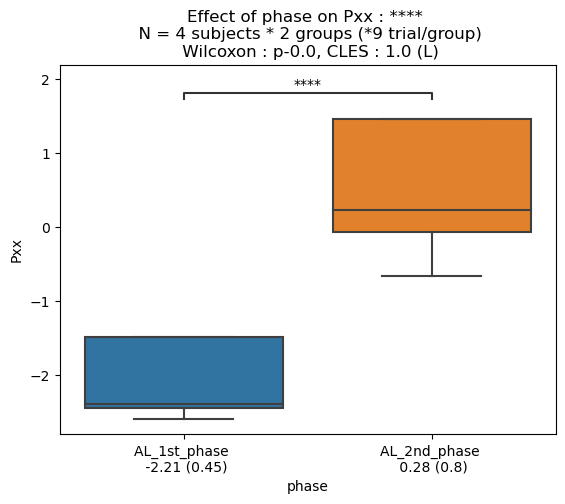

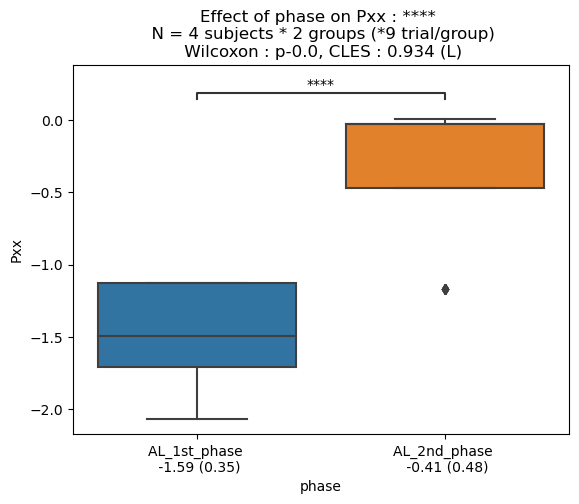

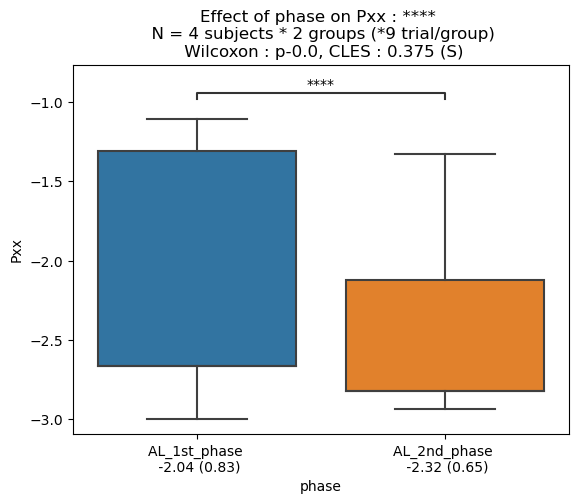

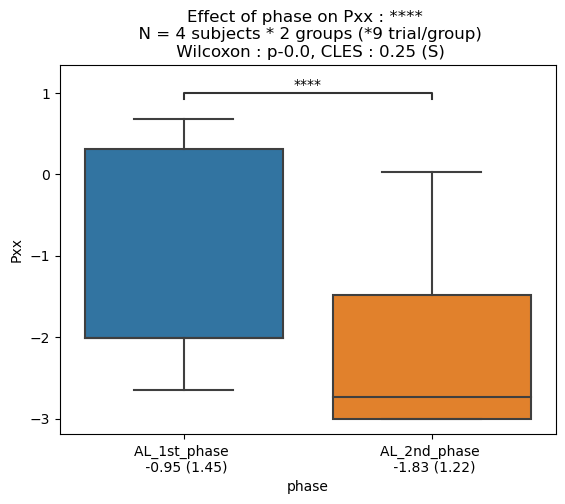

In [483]:
for band in df_TF_IE_all['band'].unique():
    if band == 'whole':
        continue
    print(band)
    df = df_TF_IE_all.query(f"band == '{band}' and phase in ['AL_1st_phase','AL_2nd_phase']").groupby(['sujet','phase','ROI']).mean().reset_index()
    auto_stats(df=df, predictor = 'phase', outcome = 'Pxx', subject = 'sujet', order = ['AL_1st_phase','AL_2nd_phase'])
# if savefig:
#     plt.savefig(folder + 'figures_stats/mean_pxx_by_cond', bbox_inches = 'tight')

theta
alpha
beta
l_gamma
h_gamma


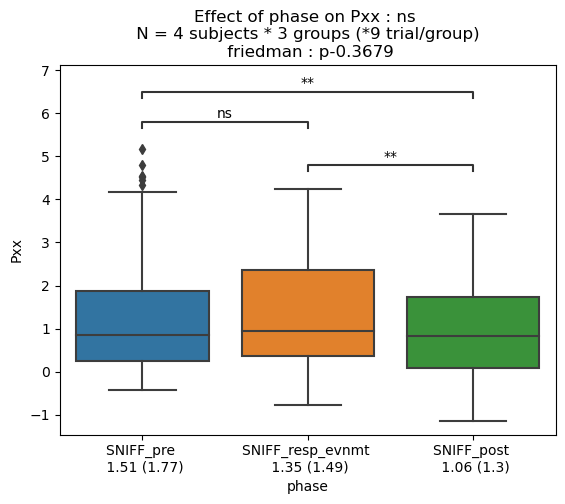

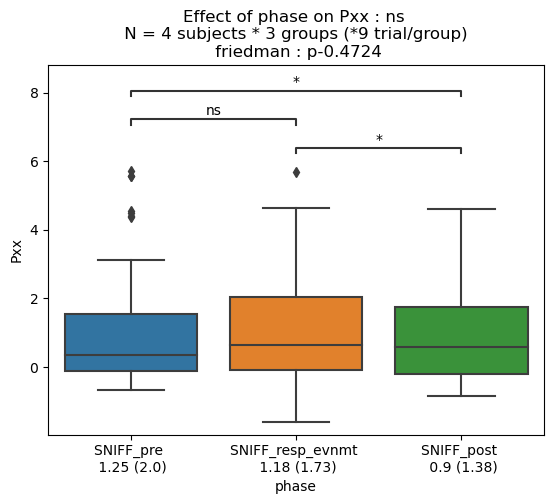

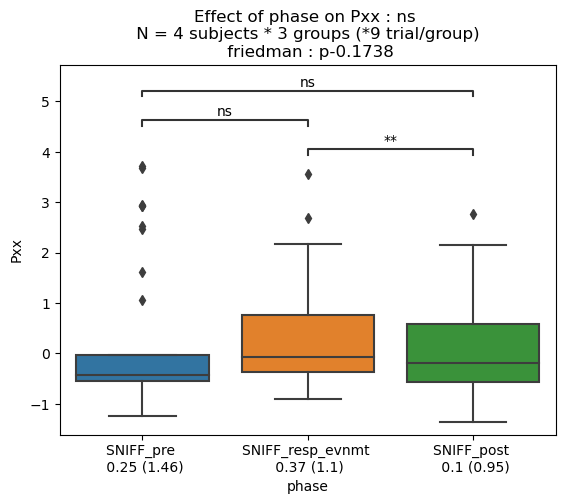

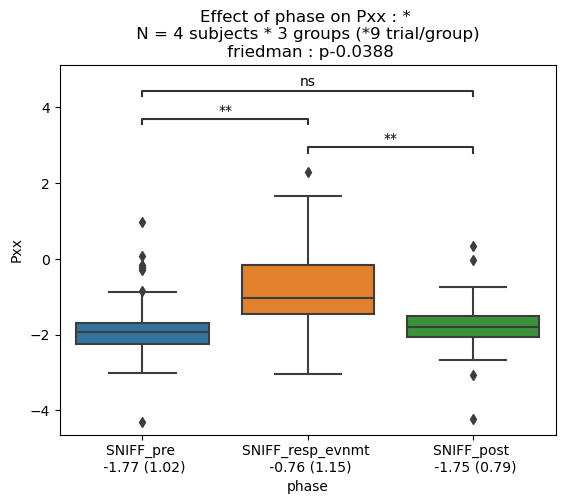

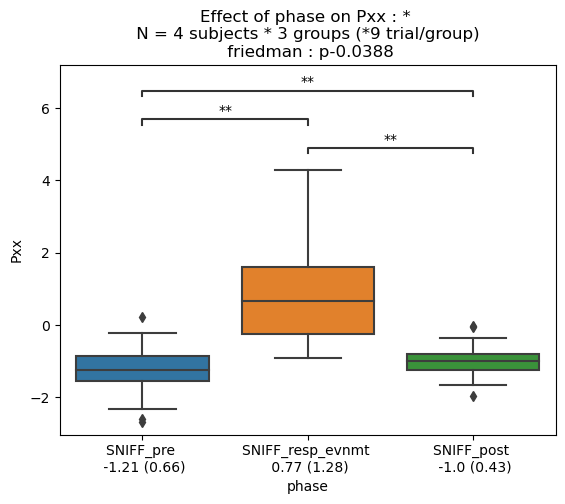

In [484]:
for band in df_TF_IE_all['band'].unique():
    if band == 'whole':
        continue
    print(band)
    df = df_TF_IE_all.query(f"band == '{band}' and phase in ['SNIFF_pre','SNIFF_resp_evnmt','SNIFF_post']").groupby(['sujet','phase','ROI']).mean().reset_index()
    auto_stats(df=df, predictor = 'phase', outcome = 'Pxx', subject = 'sujet', order = ['SNIFF_pre','SNIFF_resp_evnmt','SNIFF_post'])# fig, ax = plt.subplots()
# if savefig:
#     plt.savefig(folder + 'figures_stats/mean_pxx_by_cond', bbox_inches = 'tight')

## AC

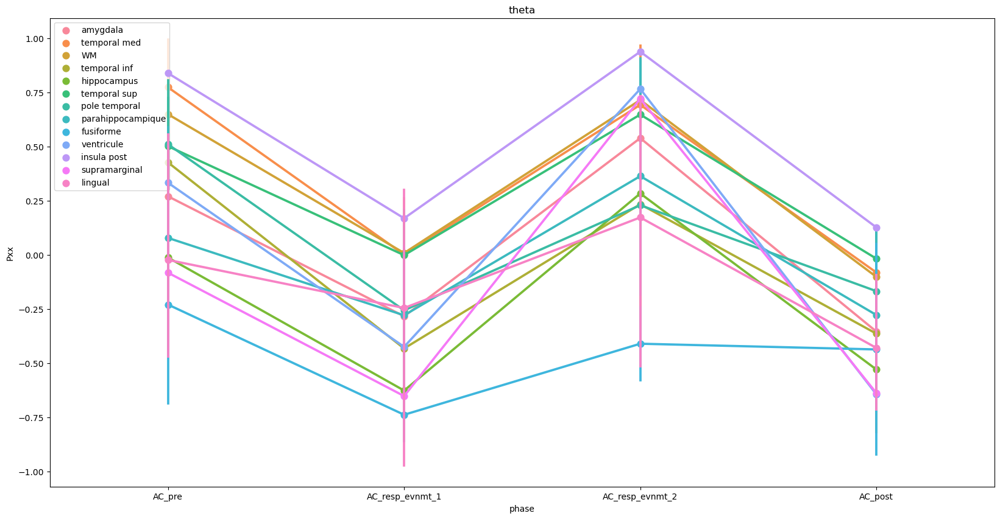

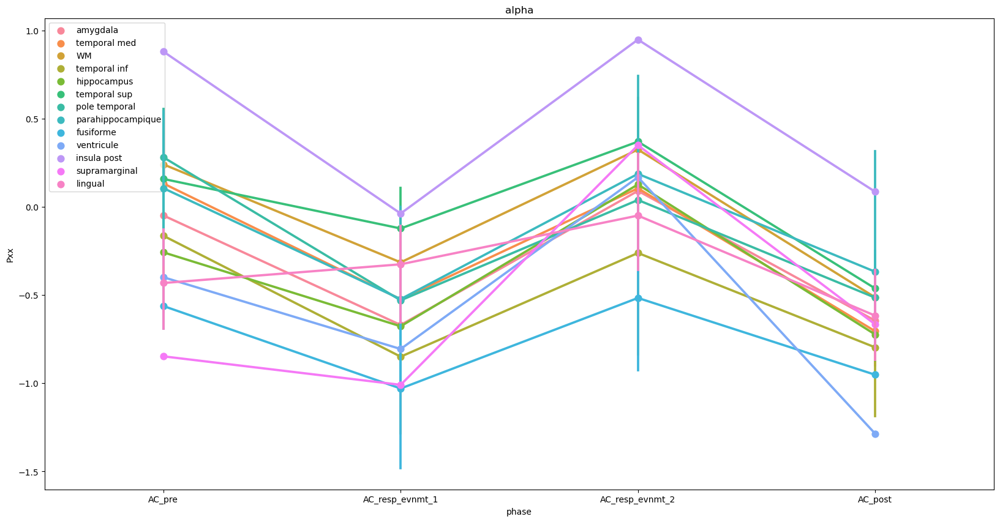

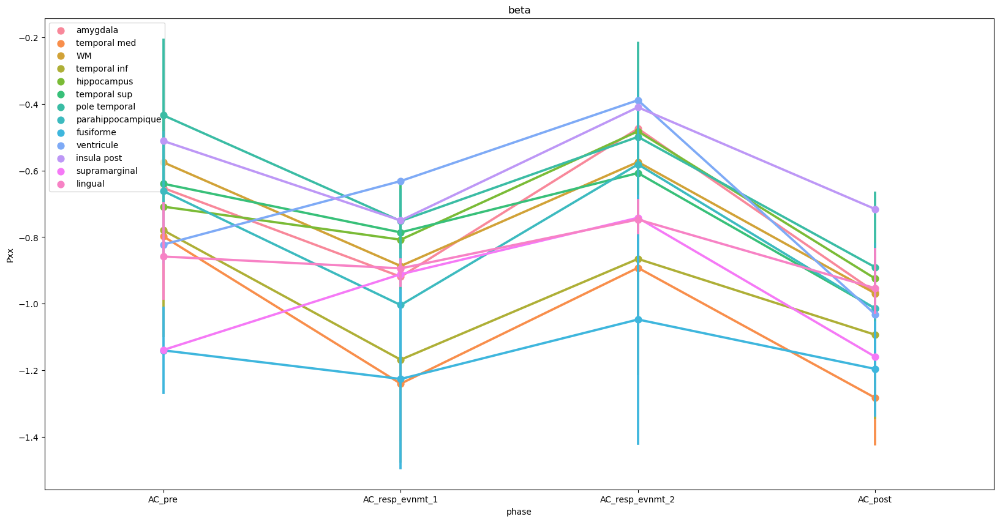

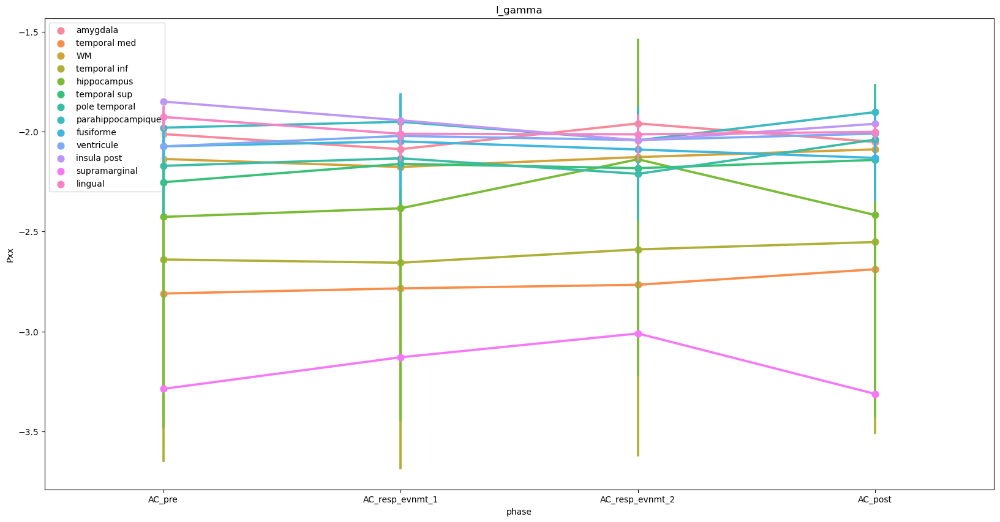

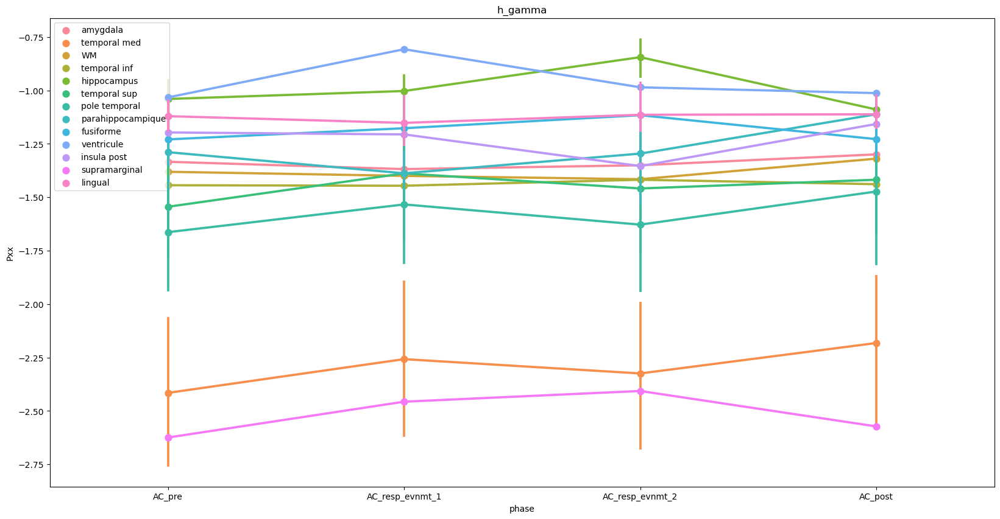

In [487]:
for band in df_TF_IE_all['band'].unique():
    if band == 'whole':
        continue
    df = df_TF_IE_all.query(f"band == '{band}' and phase in ['AC_pre','AC_resp_evnmt_1','AC_resp_evnmt_2','AC_post']")
    fig, ax = plt.subplots(figsize = (20,10))
    sns.pointplot(data=df , x = 'phase',y = 'Pxx', hue = 'ROI',ax=ax, order = ['AC_pre','AC_resp_evnmt_1','AC_resp_evnmt_2','AC_post'])
    plt.title(band)
    ax.legend(loc = 2)
    # ax.tick_params(axis='x', rotation=90)
if savefig:
    plt.savefig(folder_df + 'figures_stats/Pxx_cond_hueROI', bbox_inches = 'tight')

/tmp/ipykernel_2929990/4101622276.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff['Pxx'] = np.abs(df_TF_IE_all.query(f"phase in ['AC_post']")['Pxx'].values - df_TF_IE_all.query(f"phase in ['AC_pre']")['Pxx'].values)


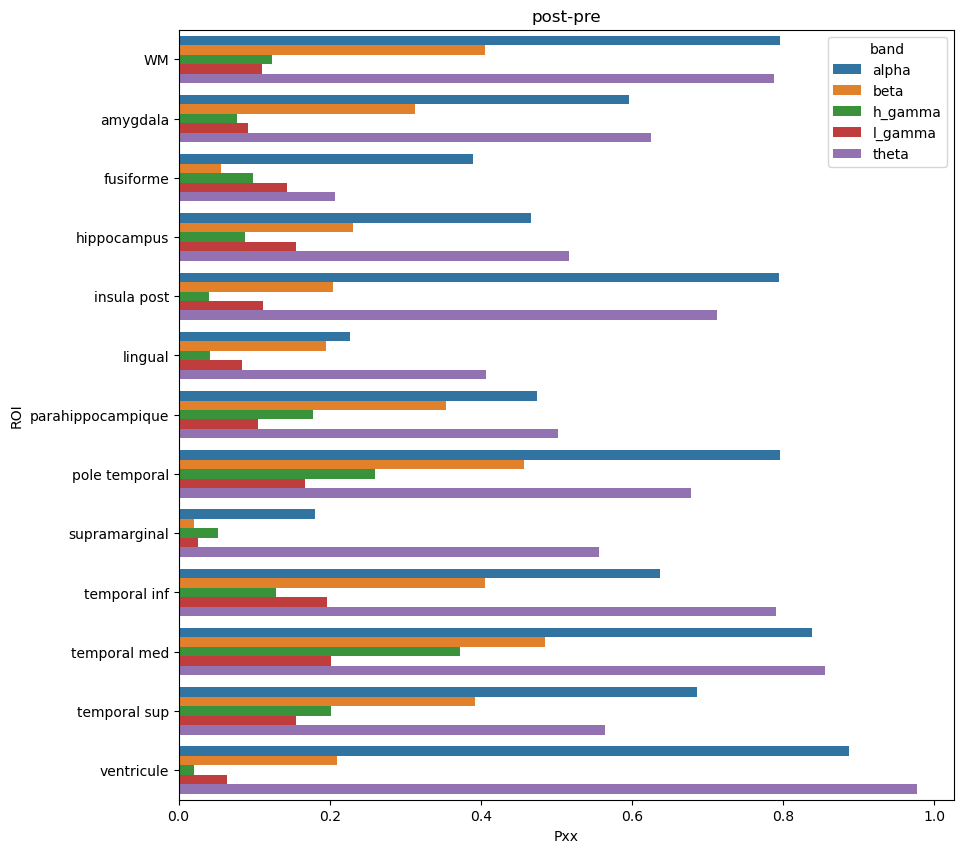

In [638]:
df_diff = df_TF_IE_all.query(f"phase in ['AC_pre']")
df_diff['Pxx'] = np.abs(df_TF_IE_all.query(f"phase in ['AC_post']")['Pxx'].values - df_TF_IE_all.query(f"phase in ['AC_pre']")['Pxx'].values)
df_diff = df_diff.query(f"band != 'whole'")
df_diff = df_diff.groupby(['band', 'ROI']).mean().reset_index()
plt.figure(figsize=(10,10))
sns.barplot(data=df_diff, x='Pxx',y='ROI',hue='band', orient = 'h')
plt.title('post-pre')
plt.show()

/tmp/ipykernel_2929990/3557308755.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff['Pxx'] = np.abs(df_TF_IE_all.query(f"phase in ['AC_resp_evnmt_2']")['Pxx'].values - df_TF_IE_all.query(f"phase in ['AC_resp_evnmt_1']")['Pxx'].values)


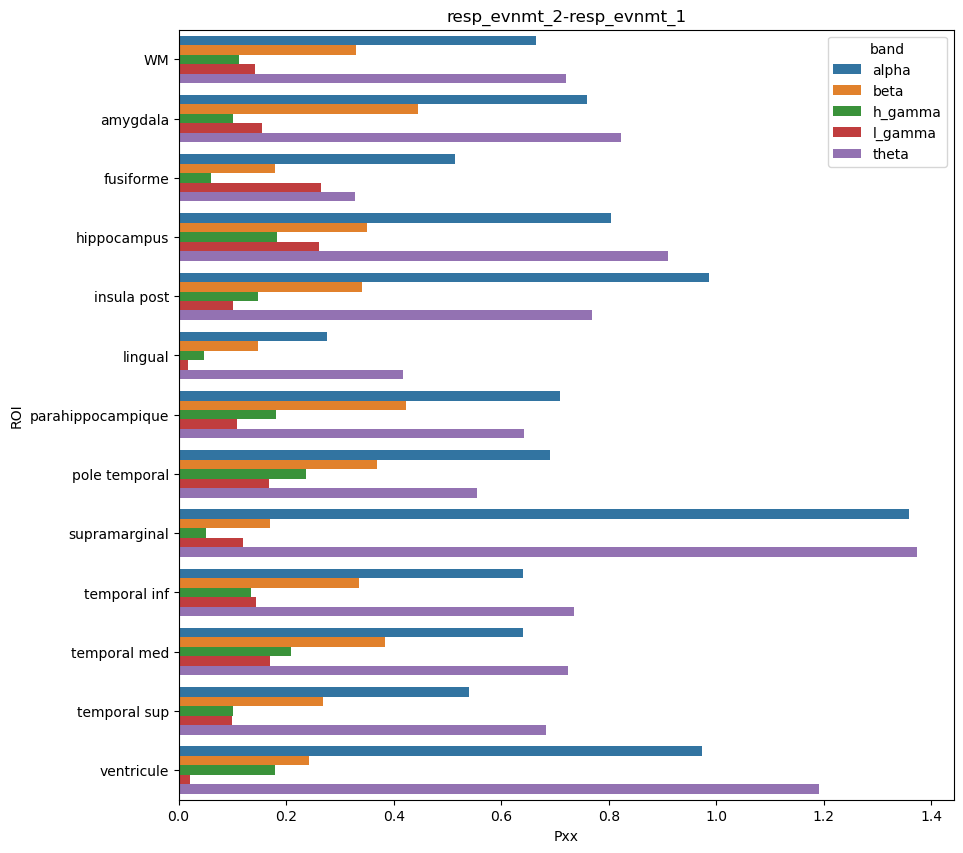

In [639]:
df_diff = df_TF_IE_all.query(f"phase in ['AC_pre']")
df_diff['Pxx'] = np.abs(df_TF_IE_all.query(f"phase in ['AC_resp_evnmt_2']")['Pxx'].values - df_TF_IE_all.query(f"phase in ['AC_resp_evnmt_1']")['Pxx'].values)
df_diff = df_diff.groupby(['band', 'ROI']).mean().reset_index()
df_diff = df_diff.query(f"band != 'whole'")
plt.figure(figsize=(10,10))
sns.barplot(data=df_diff, x='Pxx',y='ROI',hue='band', orient = 'h')
plt.title('resp_evnmt_2-resp_evnmt_1')
plt.show()

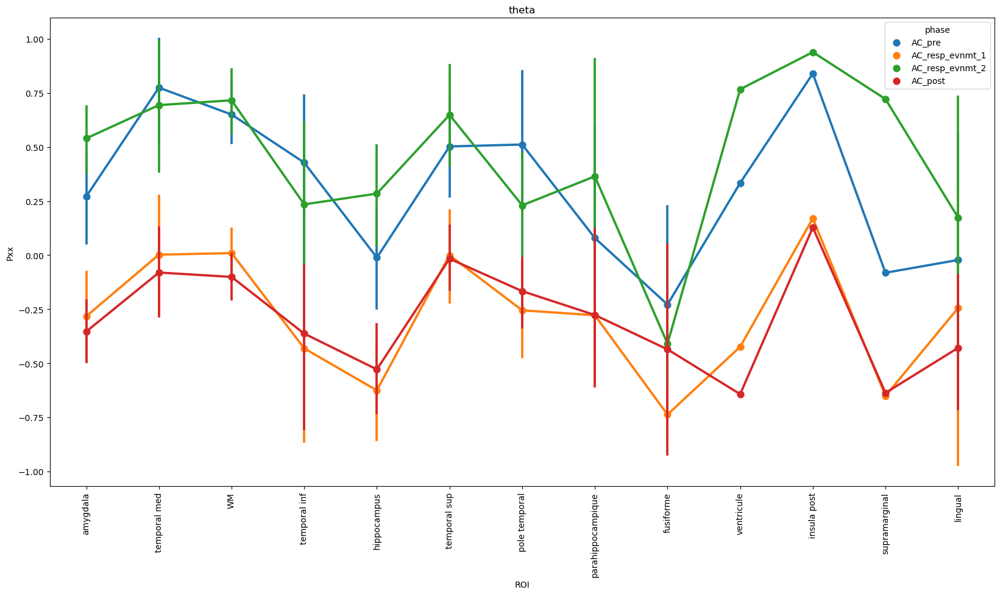

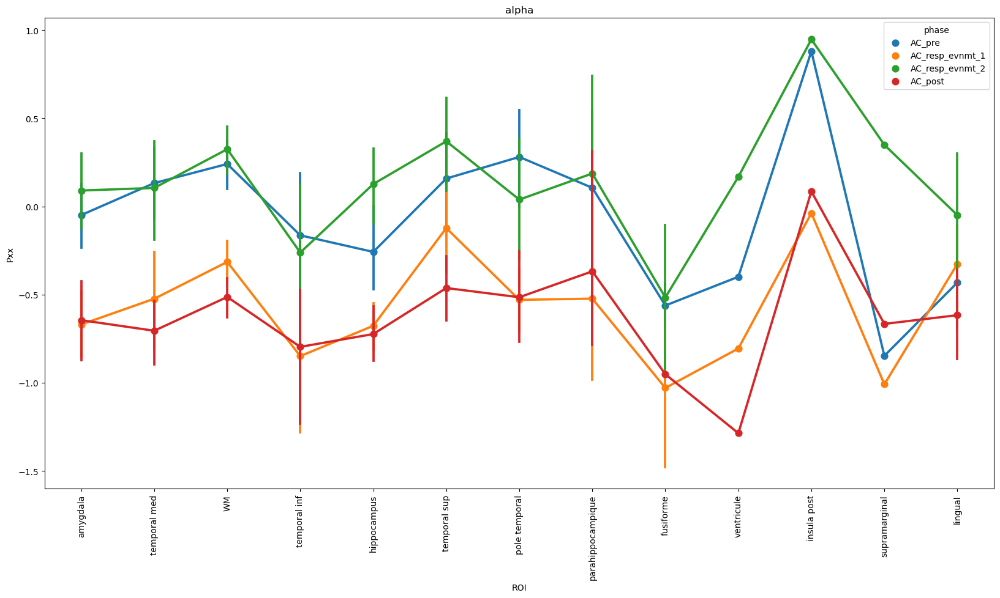

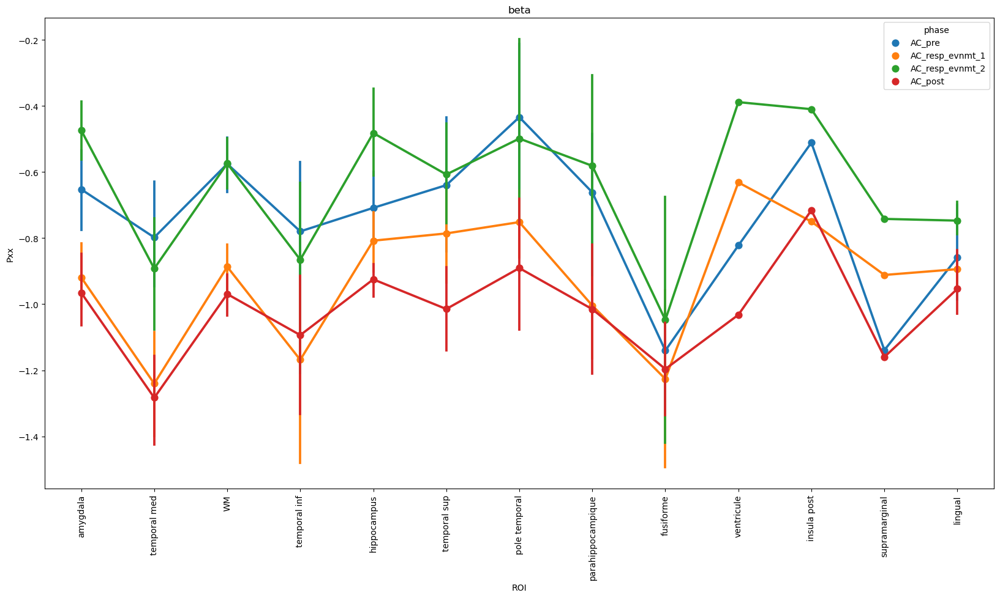

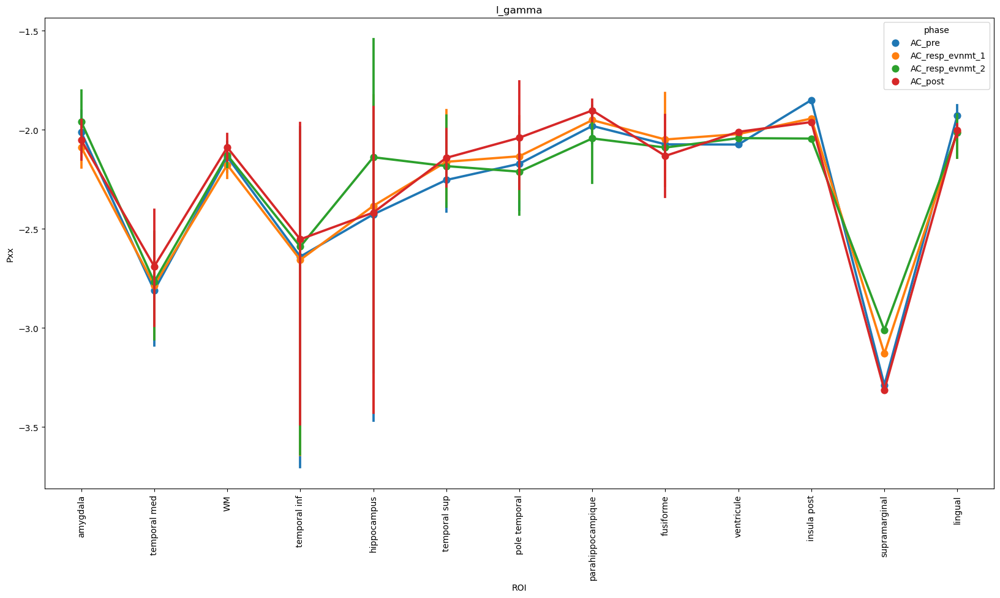

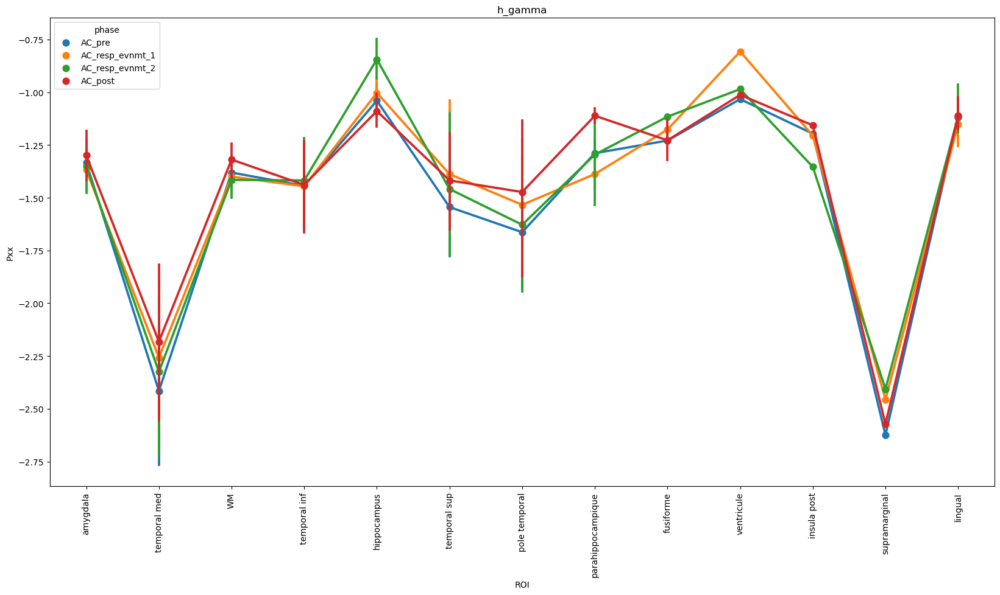

In [535]:
for band in df_TF_IE_all['band'].unique():
    if band == 'whole':
        continue
    fig, ax = plt.subplots(figsize = (20,10))
    sns.pointplot(data=df_TF_IE_all.query(f"band == '{band}' and phase in ['AC_pre','AC_resp_evnmt_1','AC_resp_evnmt_2','AC_post']") , x = 'ROI',y = 'Pxx', hue = 'phase',ax=ax, hue_order = ['AC_pre','AC_resp_evnmt_1','AC_resp_evnmt_2','AC_post'])
    plt.title(band)
    ax.tick_params(axis='x', rotation=90)

## SNIFF

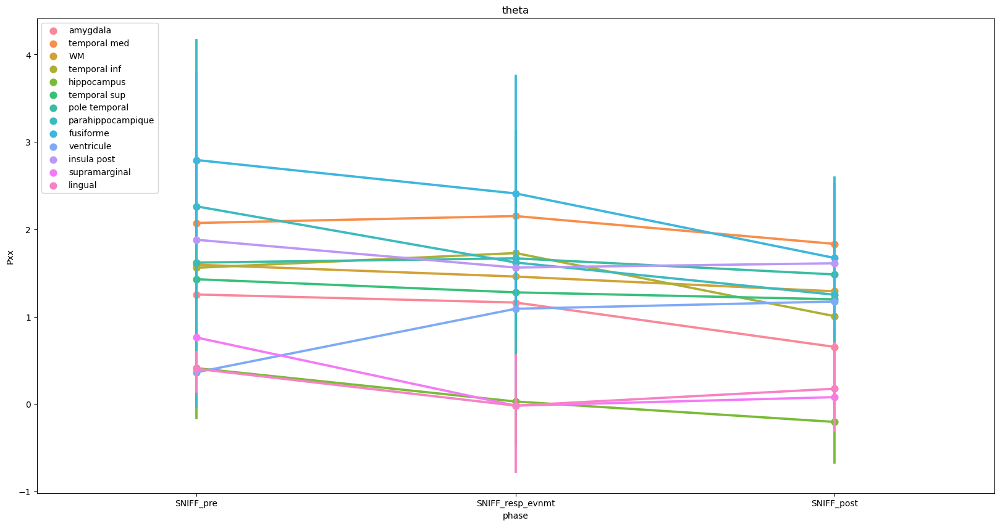

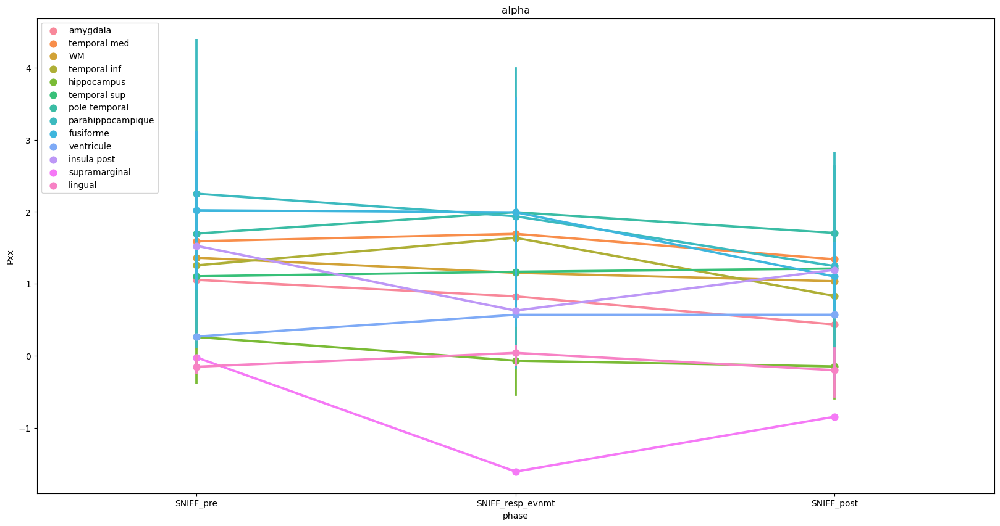

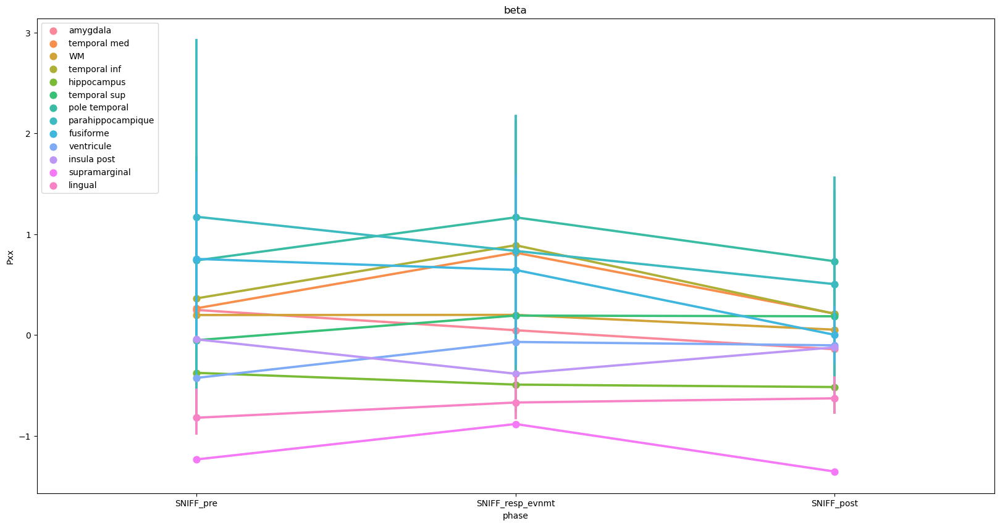

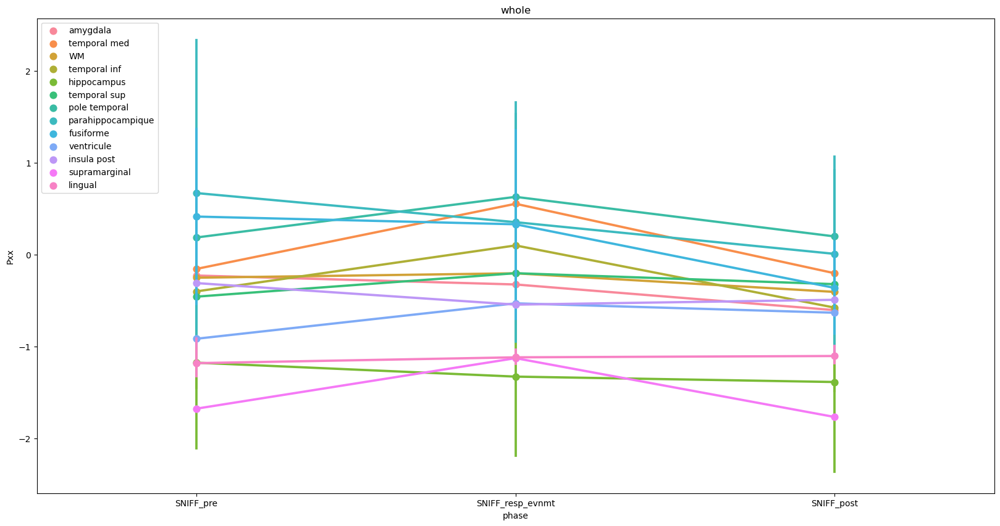

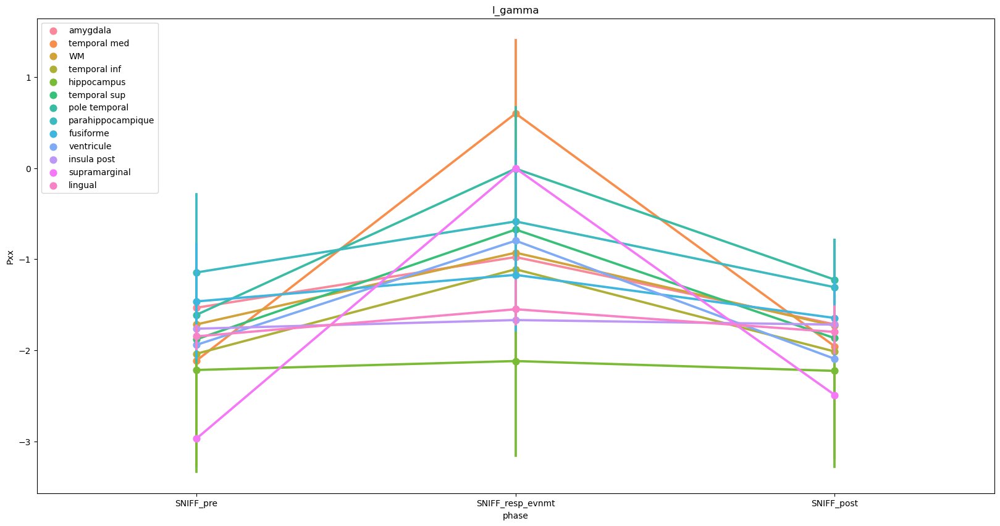

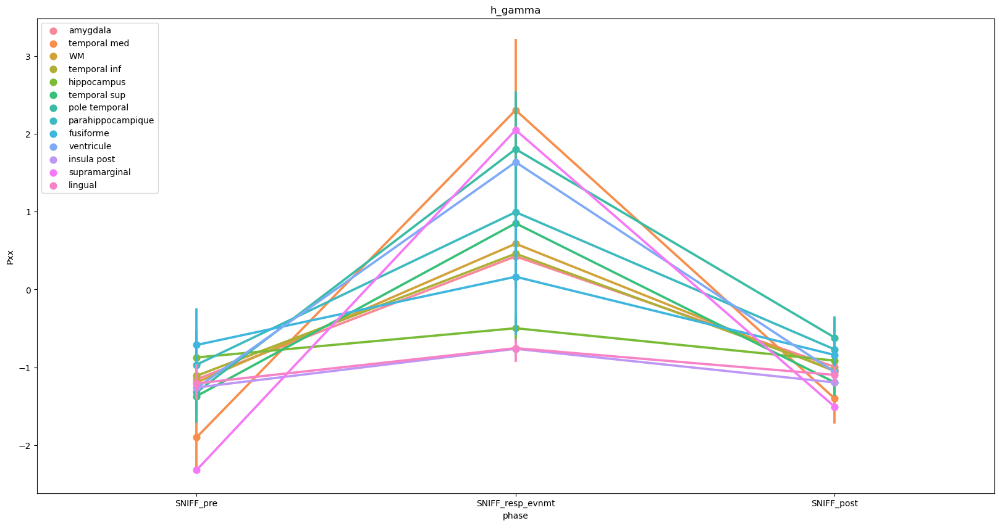

In [486]:
for band in df_TF_IE_all['band'].unique():
    df = df_TF_IE_all.query(f"band == '{band}' and phase in ['SNIFF_pre','SNIFF_resp_evnmt','SNIFF_post']")
    fig, ax = plt.subplots(figsize = (20,10))
    sns.pointplot(data=df , x = 'phase',y = 'Pxx', hue = 'ROI',ax=ax, order = ['SNIFF_pre','SNIFF_resp_evnmt','SNIFF_post'])
    plt.title(band)
    ax.legend(loc = 2)
    # ax.tick_params(axis='x', rotation=90)
if savefig:
    plt.savefig(folder_df + 'figures_stats/Pxx_cond_hueROI', bbox_inches = 'tight')

/tmp/ipykernel_2929990/3558301585.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff['Pxx'] = np.abs(df_TF_IE_all.query(f"phase in ['SNIFF_resp_evnmt']")['Pxx'].values - df_TF_IE_all.query(f"phase in ['SNIFF_pre']")['Pxx'].values)


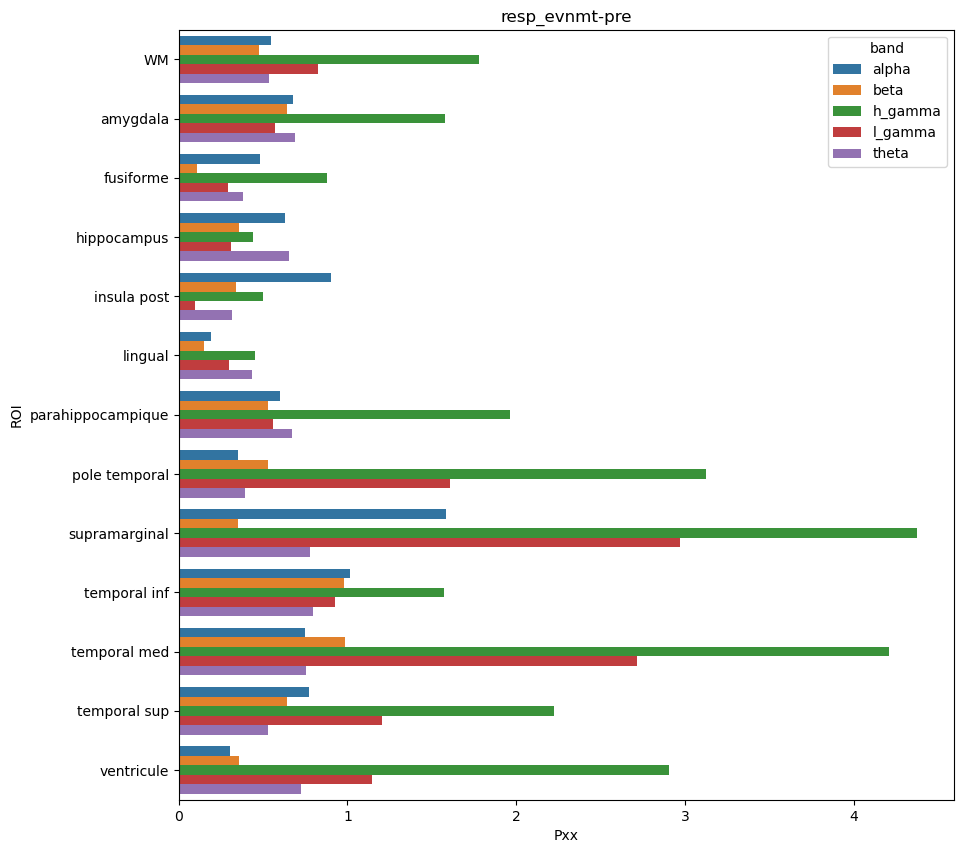

In [641]:
df_diff = df_TF_IE_all.query(f"phase in ['SNIFF_resp_evnmt']")
df_diff['Pxx'] = np.abs(df_TF_IE_all.query(f"phase in ['SNIFF_resp_evnmt']")['Pxx'].values - df_TF_IE_all.query(f"phase in ['SNIFF_pre']")['Pxx'].values)
df_diff = df_diff.groupby(['band', 'ROI']).mean().reset_index()
df_diff = df_diff.query(f"band != 'whole'")
plt.figure(figsize=(10,10))
sns.barplot(data=df_diff, x='Pxx',y='ROI',hue='band', orient = 'h')
plt.title('resp_evnmt-pre')
plt.show()

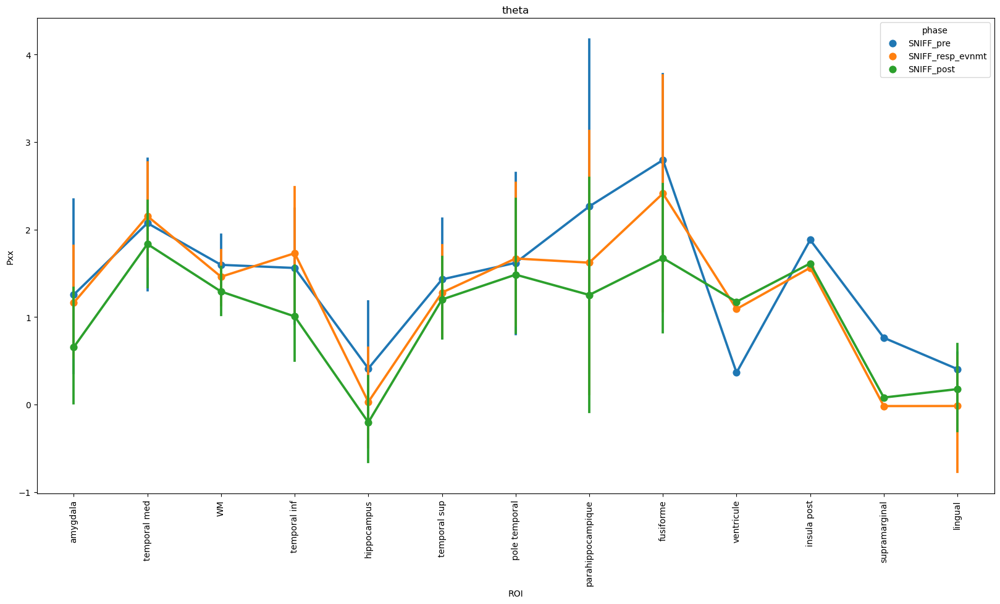

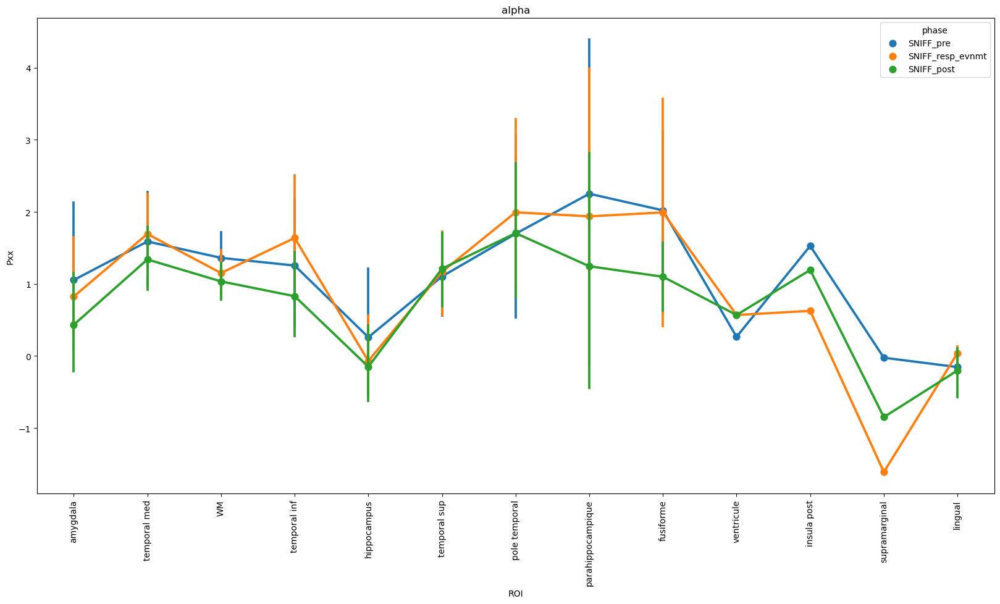

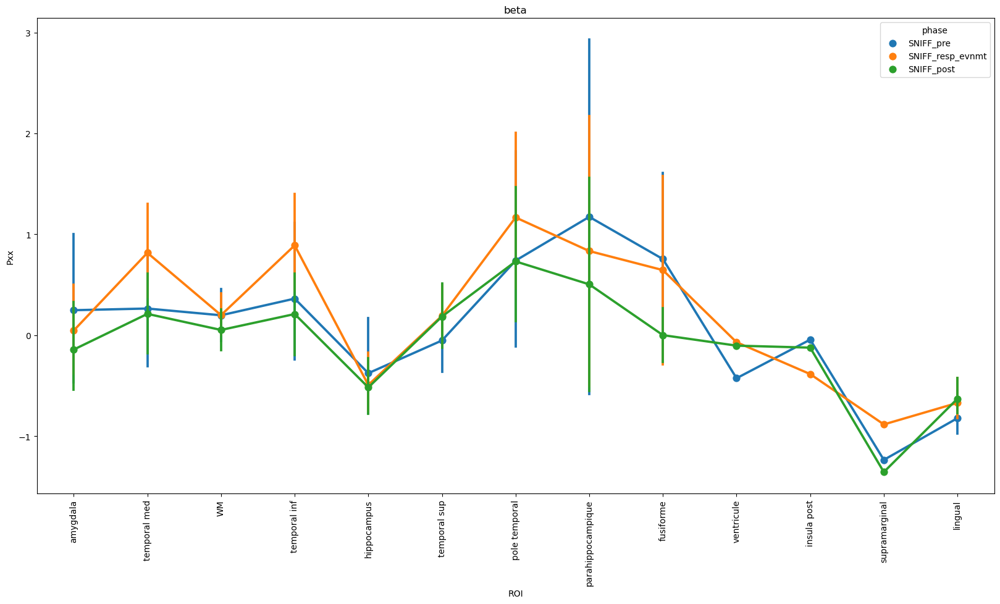

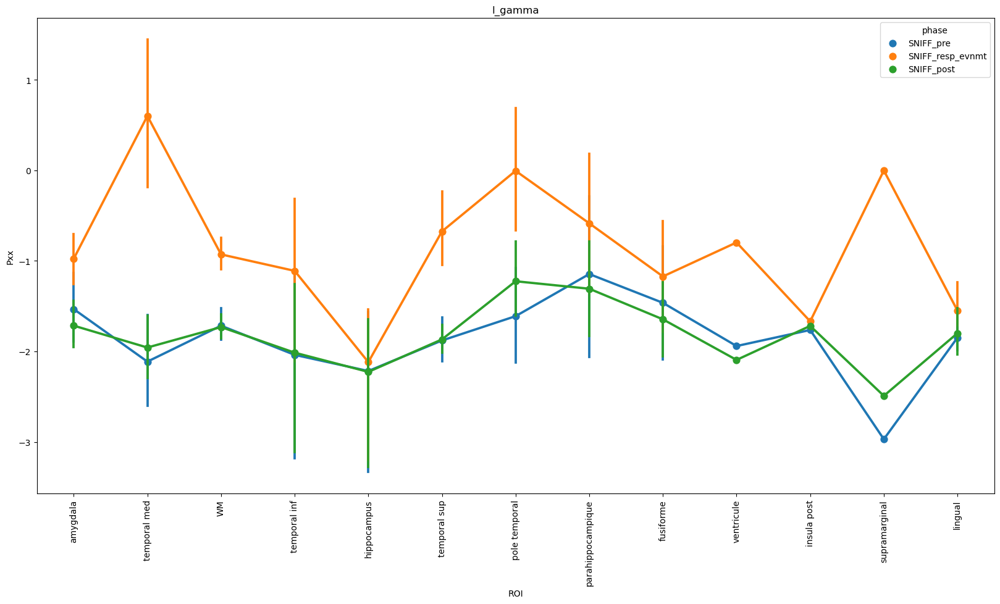

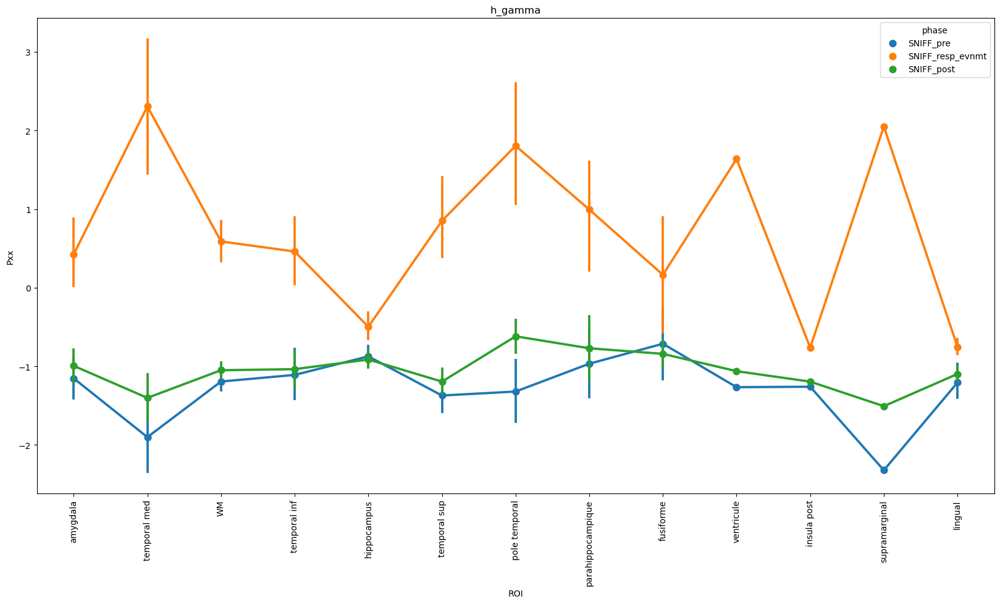

In [536]:
for band in df_TF_IE_all['band'].unique():
    if band == 'whole':
        continue
    fig, ax = plt.subplots(figsize = (20,10))
    sns.pointplot(data=df_TF_IE_all.query(f"band == '{band}' and phase in ['SNIFF_pre','SNIFF_resp_evnmt','SNIFF_post']") , x = 'ROI',y = 'Pxx', hue = 'phase',ax=ax, hue_order = ['SNIFF_pre','SNIFF_resp_evnmt','SNIFF_post'])
    plt.title(band)
    ax.tick_params(axis='x', rotation=90)

## AL

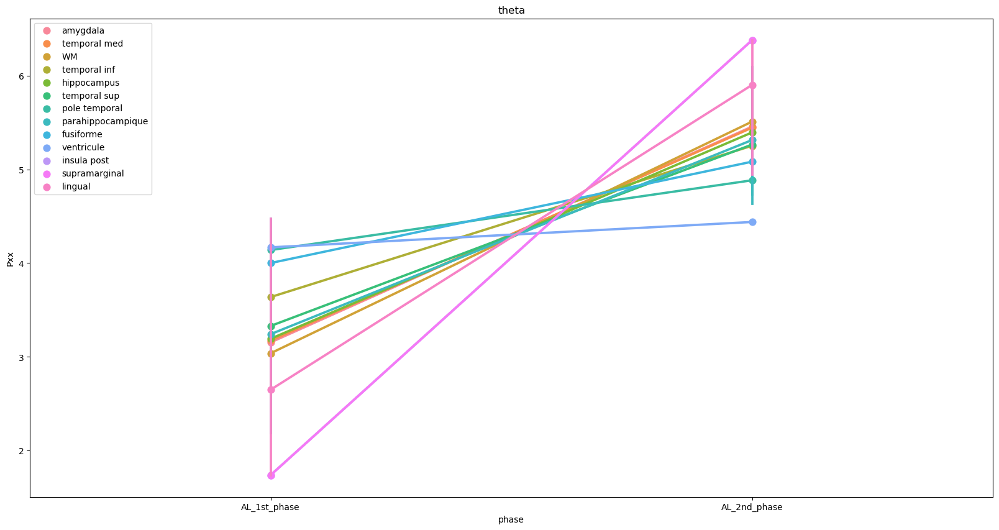

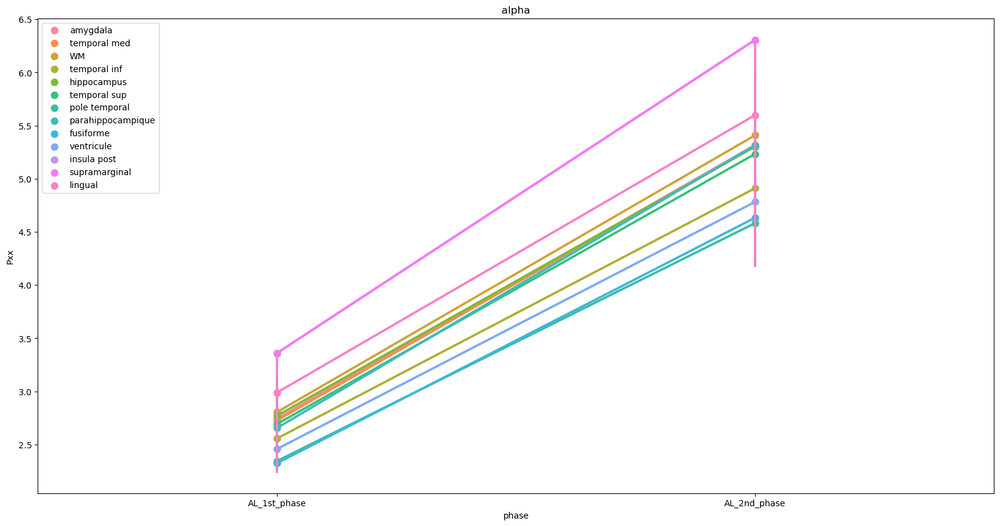

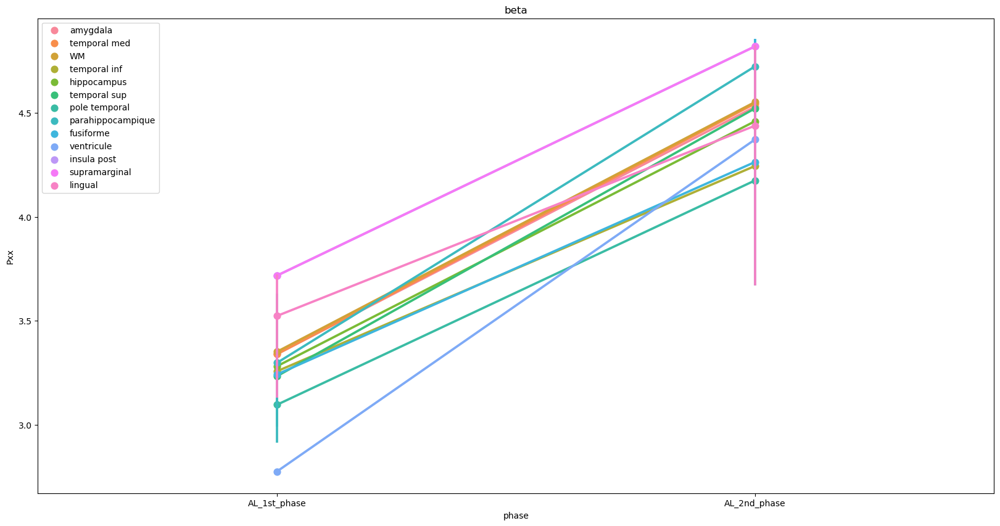

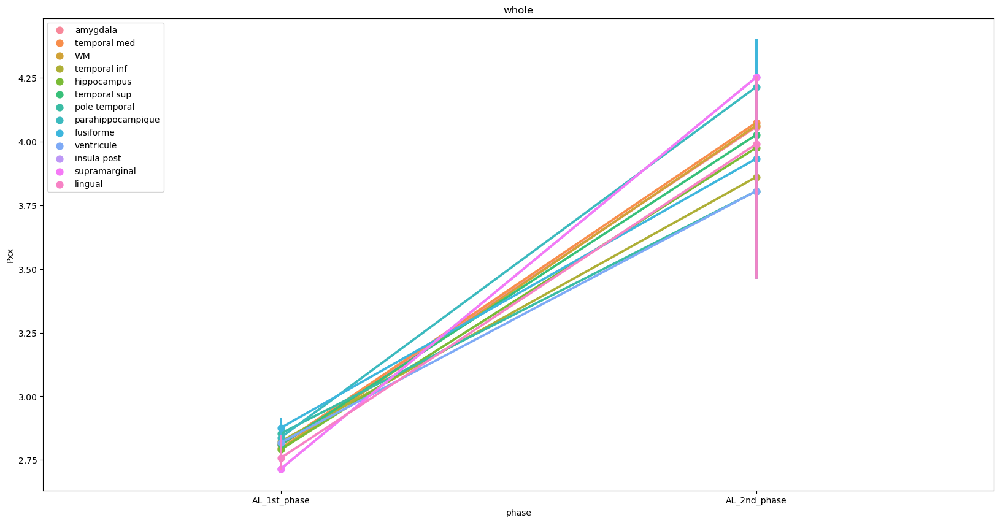

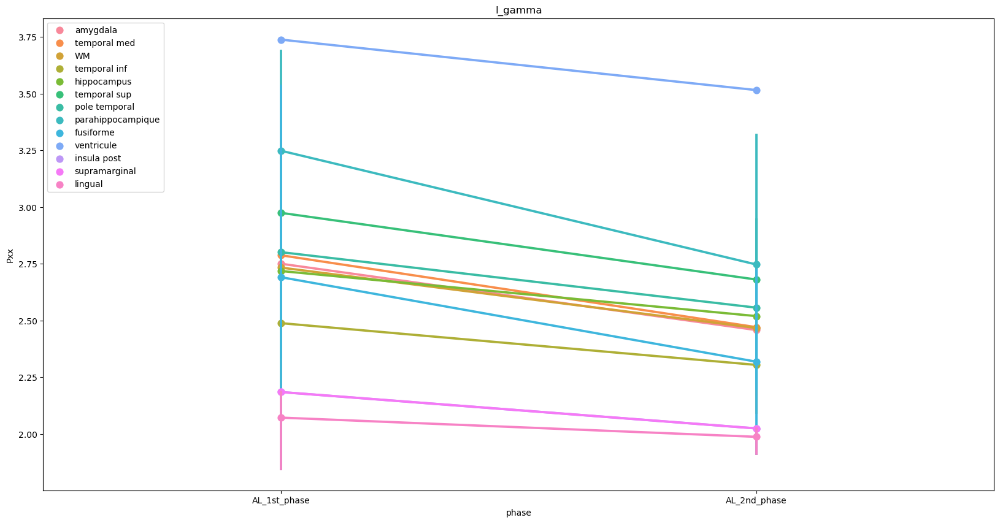

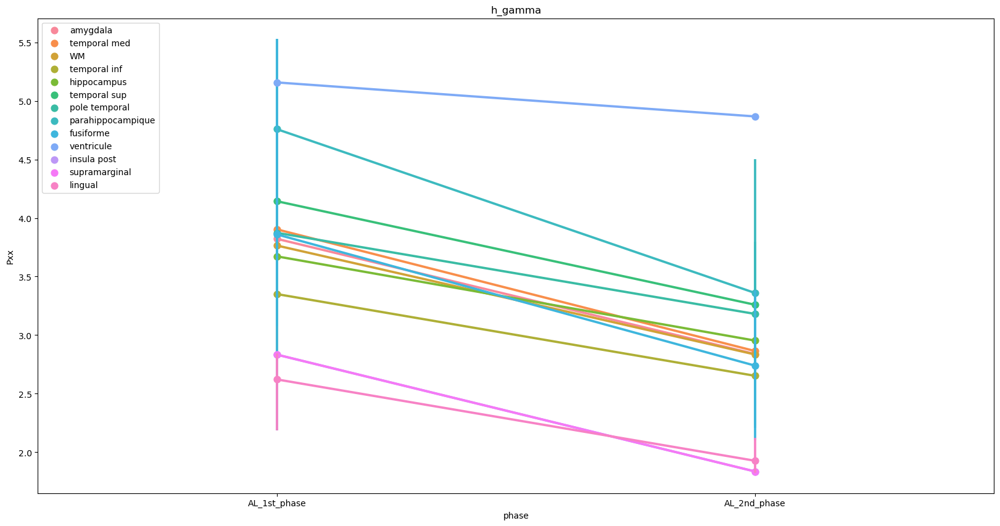

In [456]:
for band in df_TF_IE_all['band'].unique():
    df = df_TF_IE_all.query(f"band == '{band}' and phase in ['AL_1st_phase', 'AL_2nd_phase']")
    fig, ax = plt.subplots(figsize = (20,10))
    sns.pointplot(data=df , x = 'phase',y = 'Pxx', hue = 'ROI',ax=ax, order = ['AL_1st_phase', 'AL_2nd_phase'])
    plt.title(band)
    ax.legend(loc = 2)
    # ax.tick_params(axis='x', rotation=90)
if savefig:
    plt.savefig(folder_df + 'figures_stats/Pxx_cond_hueROI', bbox_inches = 'tight')

/tmp/ipykernel_2929990/2562414700.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff['Pxx'] = np.abs(df_TF_IE_all.query(f"phase in ['AL_2nd_phase']")['Pxx'].values - df_TF_IE_all.query(f"phase in ['AL_1st_phase']")['Pxx'].values)


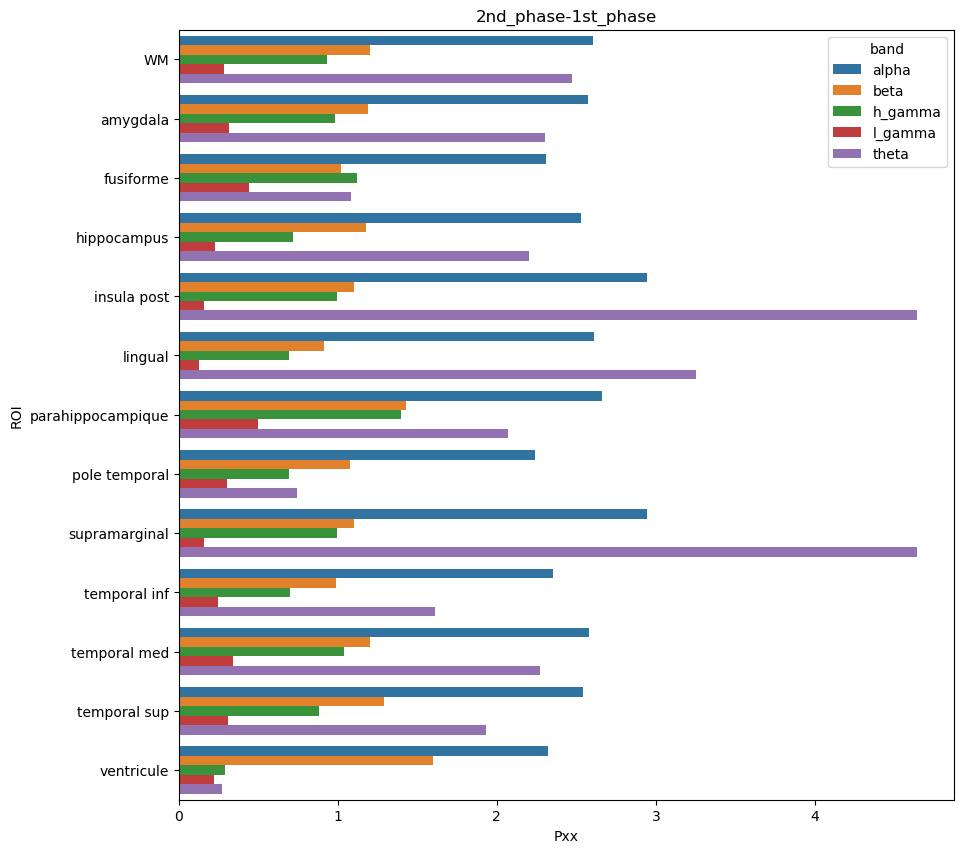

In [642]:
df_diff = df_TF_IE_all.query(f"phase in ['AL_1st_phase']")
df_diff['Pxx'] = np.abs(df_TF_IE_all.query(f"phase in ['AL_2nd_phase']")['Pxx'].values - df_TF_IE_all.query(f"phase in ['AL_1st_phase']")['Pxx'].values)
df_diff = df_diff.groupby(['band', 'ROI']).mean().reset_index()
df_diff = df_diff.query(f"band != 'whole'")
plt.figure(figsize=(10,10))
sns.barplot(data=df_diff, x='Pxx',y='ROI',hue='band', orient = 'h')
plt.title('2nd_phase-1st_phase')
plt.show()


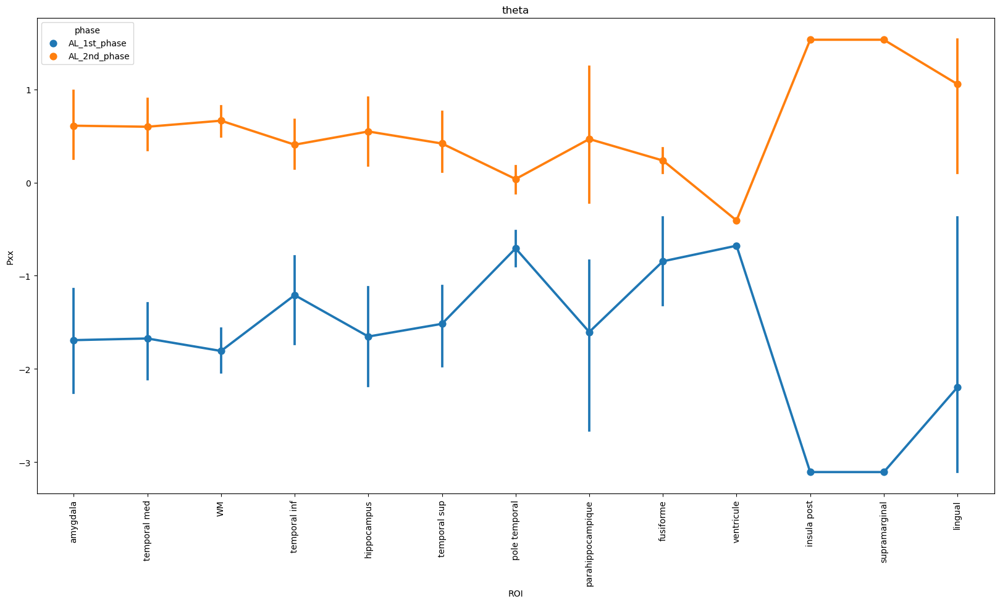

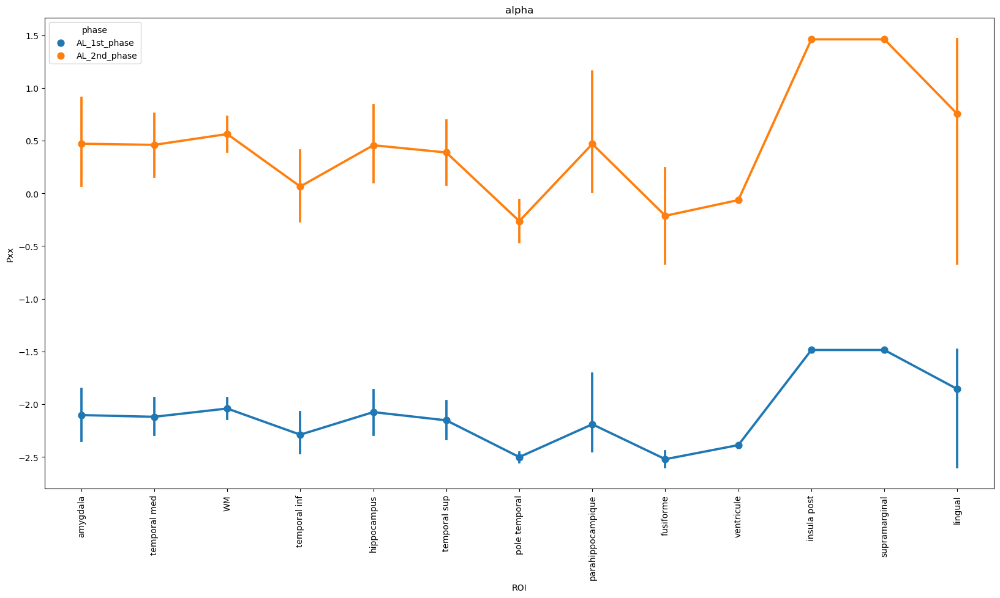

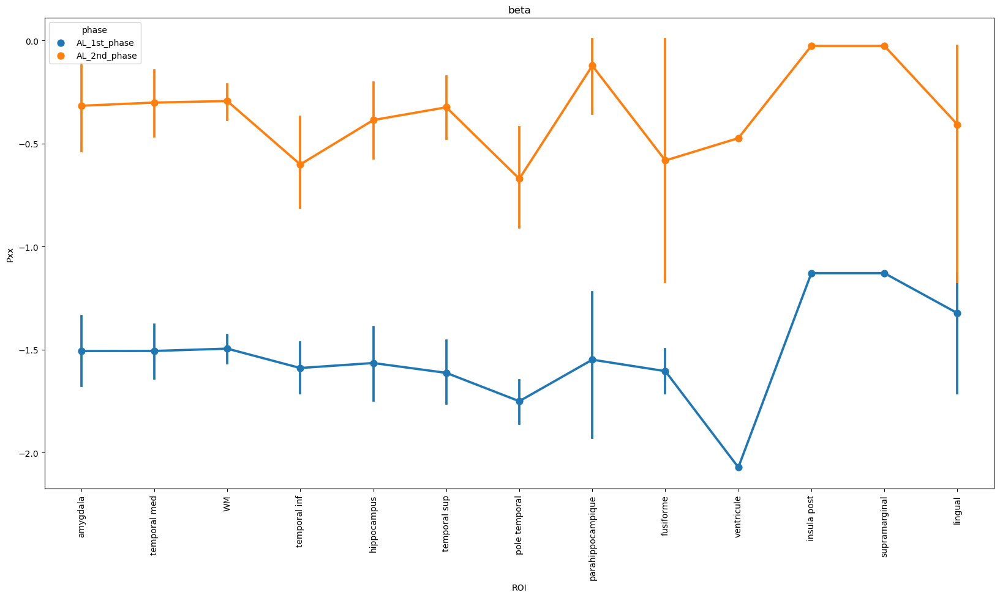

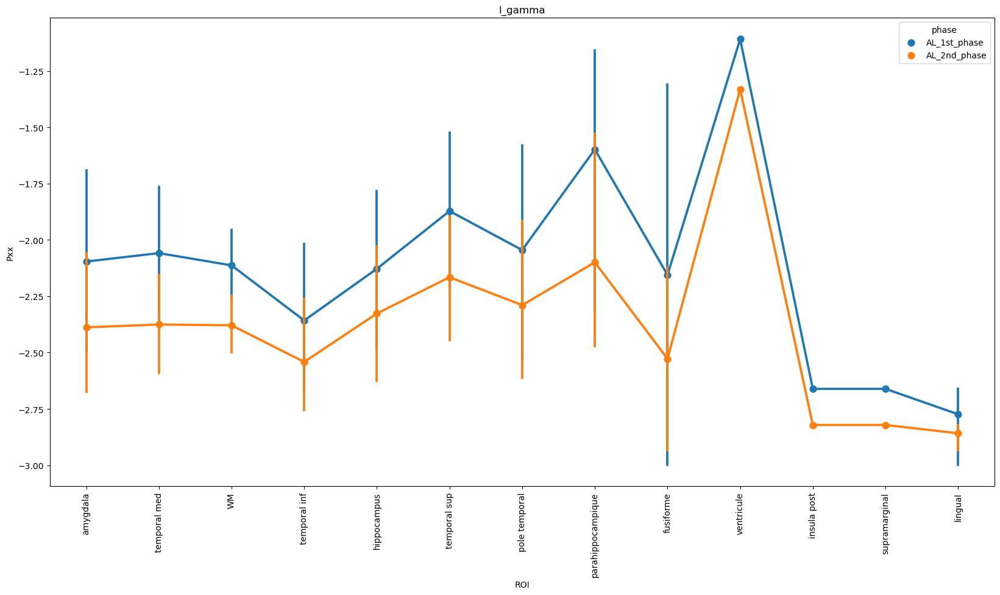

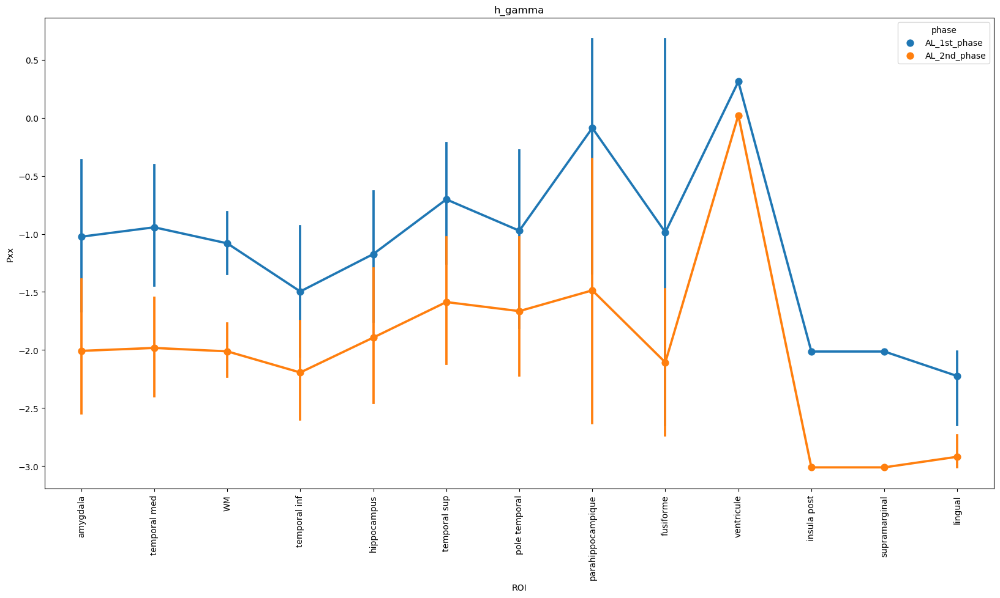

In [537]:
for band in df_TF_IE_all['band'].unique():
    if band == 'whole':
        continue
    fig, ax = plt.subplots(figsize = (20,10))
    sns.pointplot(data=df_TF_IE_all.query(f"band == '{band}' and phase in ['AL_1st_phase', 'AL_2nd_phase']") , x = 'ROI',y = 'Pxx', hue = 'phase',ax=ax, hue_order = ['AL_1st_phase', 'AL_2nd_phase'])
    plt.title(band)
    ax.tick_params(axis='x', rotation=90)


In [390]:
mapper_n_rois = {roi:df_TF_IE_all['ROI'].value_counts()[roi] for roi in df_TF_IE_all.groupby(['ROI']).mean().index}

# GRAPHS

In [391]:
df_DFC = pd.read_excel('allplot_df_graph_DFC.xlsx', index_col = 0)

In [392]:
metrics = df_DFC['metric'].unique()
outcomes = ['CPL','GE','SWN']
phases = df_DFC['phase'].unique()

In [393]:
df_DFC

,sujet,cond,band,metric,phase,CPL,GE,SWN,Unnamed: 0
0,pat_03083_1527,SNIFF,beta,ispc,pre,1.357143,0.821429,0.006211,0
1,pat_03083_1527,SNIFF,beta,ispc,resp_evnt,1.357143,0.821429,0.047619,0
2,pat_03083_1527,SNIFF,beta,ispc,post,1.357143,0.821429,0.022556,0
3,pat_03083_1527,SNIFF,beta,wpli,pre,1.500000,0.750000,0.073611,0
4,pat_03083_1527,SNIFF,beta,wpli,resp_evnt,1.500000,0.750000,0.368519,0
...,...,...,...,...,...,...,...,...,...
43,pat_03138_1601,AC,h_gamma,ispc,resp_evnt,1.500000,0.750000,-0.106944,0
44,pat_03138_1601,AC,h_gamma,ispc,post,1.500000,0.750000,-0.041608,0
45,pat_03138_1601,AC,h_gamma,wpli,pre,1.583333,0.736111,-0.132234,0
46,pat_03138_1601,AC,h_gamma,wpli,resp_evnt,1.666667,0.724537,-0.130776,0


In [394]:
df_DFC_all = df_DFC.drop(['Unnamed: 0'], axis=1)
df_DFC_all['phase'] = [f'{cond_i}_{phase_i}' for phase_i, cond_i in zip(df_DFC_all['phase'], df_DFC_all['cond']) ]
df_DFC_all = df_DFC_all.drop(['cond'], axis=1)


In [395]:
predictors = ['cond','band','phase']

In [396]:
df_DFC_all

,sujet,band,metric,phase,CPL,GE,SWN
0,pat_03083_1527,beta,ispc,SNIFF_pre,1.357143,0.821429,0.006211
1,pat_03083_1527,beta,ispc,SNIFF_resp_evnt,1.357143,0.821429,0.047619
2,pat_03083_1527,beta,ispc,SNIFF_post,1.357143,0.821429,0.022556
3,pat_03083_1527,beta,wpli,SNIFF_pre,1.500000,0.750000,0.073611
4,pat_03083_1527,beta,wpli,SNIFF_resp_evnt,1.500000,0.750000,0.368519
...,...,...,...,...,...,...,...
43,pat_03138_1601,h_gamma,ispc,AC_resp_evnt,1.500000,0.750000,-0.106944
44,pat_03138_1601,h_gamma,ispc,AC_post,1.500000,0.750000,-0.041608
45,pat_03138_1601,h_gamma,wpli,AC_pre,1.583333,0.736111,-0.132234
46,pat_03138_1601,h_gamma,wpli,AC_resp_evnt,1.666667,0.724537,-0.130776


## SNIFF

/home/jules/anaconda3/lib/python3.8/site-packages/pingouin/distribution.py:977: RuntimeWarning: divide by zero encountered in double_scalars
  W = np.product(eig) / (eig.sum() / d) ** d
/home/jules/anaconda3/lib/python3.8/site-packages/pingouin/distribution.py:977: RuntimeWarning: divide by zero encountered in double_scalars
  W = np.product(eig) / (eig.sum() / d) ** d
/home/jules/anaconda3/lib/python3.8/site-packages/pingouin/distribution.py:977: RuntimeWarning: divide by zero encountered in double_scalars
  W = np.product(eig) / (eig.sum() / d) ** d
/home/jules/anaconda3/lib/python3.8/site-packages/pingouin/distribution.py:977: RuntimeWarning: divide by zero encountered in double_scalars
  W = np.product(eig) / (eig.sum() / d) ** d
/home/jules/anaconda3/lib/python3.8/site-packages/pingouin/distribution.py:977: RuntimeWarning: divide by zero encountered in double_scalars
  W = np.product(eig) / (eig.sum() / d) ** d
/home/jules/anaconda3/lib/python3.8/site-packages/pingouin/distributio

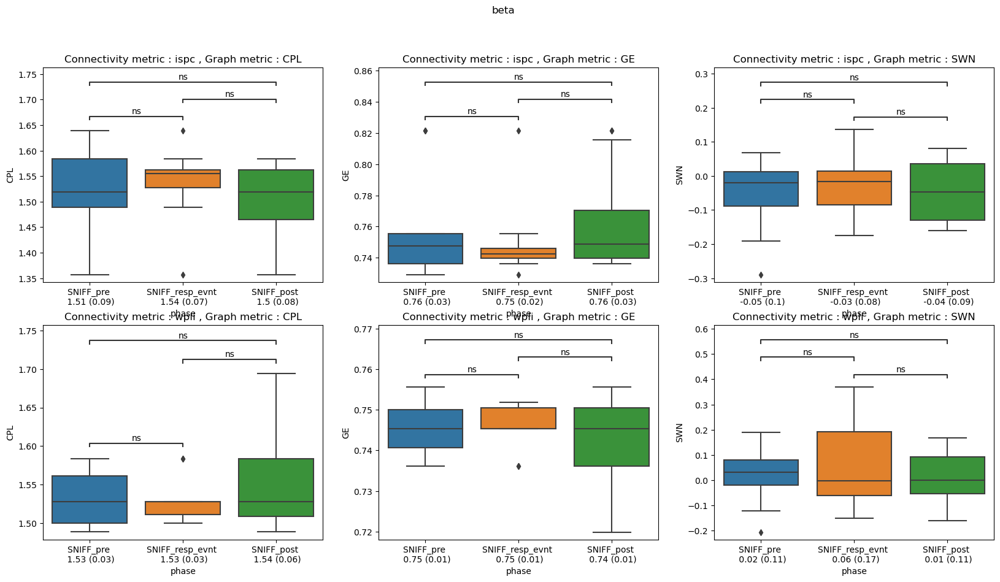

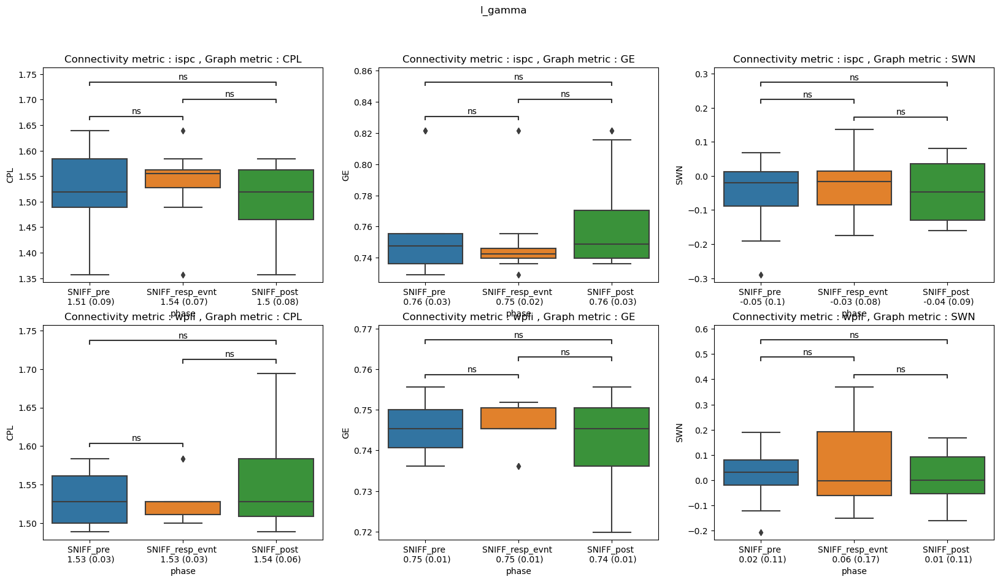

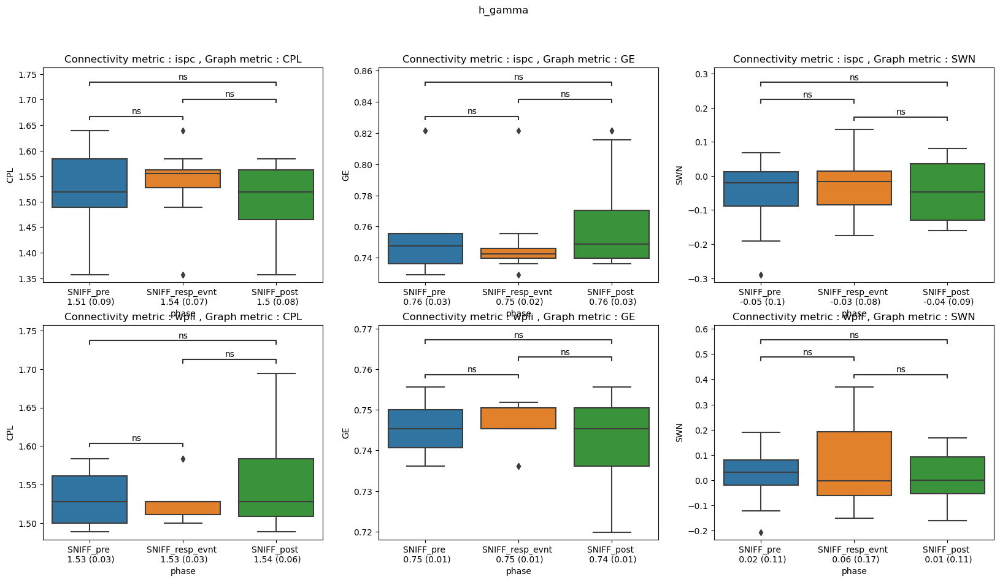

In [548]:
for band in df_DFC_all['band'].unique():
    fig , axs = plt.subplots(nrows = len(metrics), ncols = len(outcomes), figsize = (20,10))
    plt.suptitle(band)
    for row, metric in enumerate(metrics):
        for col, outcome in enumerate(outcomes):
            ax = axs[row, col]
            df = df_DFC_all.query(f"metric == '{metric}' & phase in ['SNIFF_pre', 'SNIFF_resp_evnt', 'SNIFF_post']")
            auto_stats(df=df, predictor = 'phase', outcome = outcome, subject = 'sujet', order = ['SNIFF_pre', 'SNIFF_resp_evnt', 'SNIFF_post'], ax=ax)
            # sns.pointplot(data=df, x = 'phase', y = outcome, ax=ax, hue = 'band')
            # auto_stats(df=df_DFC_all[df_DFC_all['metric'] == metric], predictor = 'cond', outcome = outcome, ax=ax, subject = 'sujet')
            ax.set_title(f'Connectivity metric : {metric} , Graph metric : {outcome}')


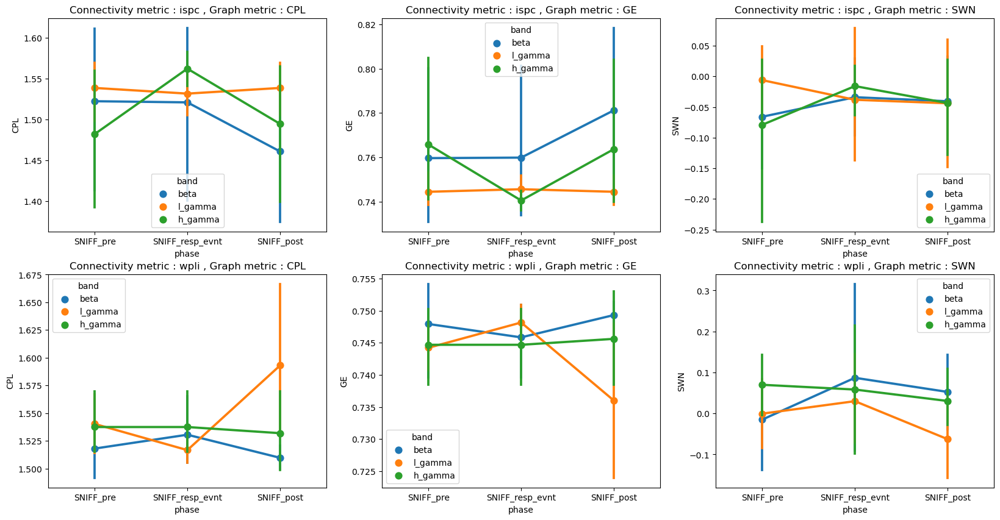

In [549]:
fig , axs = plt.subplots(nrows = len(metrics), ncols = len(outcomes), figsize = (20,10))
for row, metric in enumerate(metrics):
    for col, outcome in enumerate(outcomes):
        ax = axs[row, col]
        df = df_DFC_all.query(f"metric == '{metric}' & phase in ['SNIFF_pre', 'SNIFF_resp_evnt', 'SNIFF_post']")
        sns.pointplot(data=df, x = 'phase', y = outcome, ax=ax, hue = 'band')
        # auto_stats(df=df_DFC_all[df_DFC_all['metric'] == metric], predictor = 'cond', outcome = outcome, ax=ax, subject = 'sujet')
        ax.set_title(f'Connectivity metric : {metric} , Graph metric : {outcome}')

## AC

/home/jules/anaconda3/lib/python3.8/site-packages/pingouin/distribution.py:977: RuntimeWarning: divide by zero encountered in double_scalars
  W = np.product(eig) / (eig.sum() / d) ** d
/home/jules/anaconda3/lib/python3.8/site-packages/pingouin/distribution.py:977: RuntimeWarning: divide by zero encountered in double_scalars
  W = np.product(eig) / (eig.sum() / d) ** d
/home/jules/anaconda3/lib/python3.8/site-packages/pingouin/distribution.py:977: RuntimeWarning: divide by zero encountered in double_scalars
  W = np.product(eig) / (eig.sum() / d) ** d
/home/jules/anaconda3/lib/python3.8/site-packages/pingouin/distribution.py:977: RuntimeWarning: divide by zero encountered in double_scalars
  W = np.product(eig) / (eig.sum() / d) ** d
/home/jules/anaconda3/lib/python3.8/site-packages/pingouin/distribution.py:977: RuntimeWarning: divide by zero encountered in double_scalars
  W = np.product(eig) / (eig.sum() / d) ** d
/home/jules/anaconda3/lib/python3.8/site-packages/pingouin/distributio

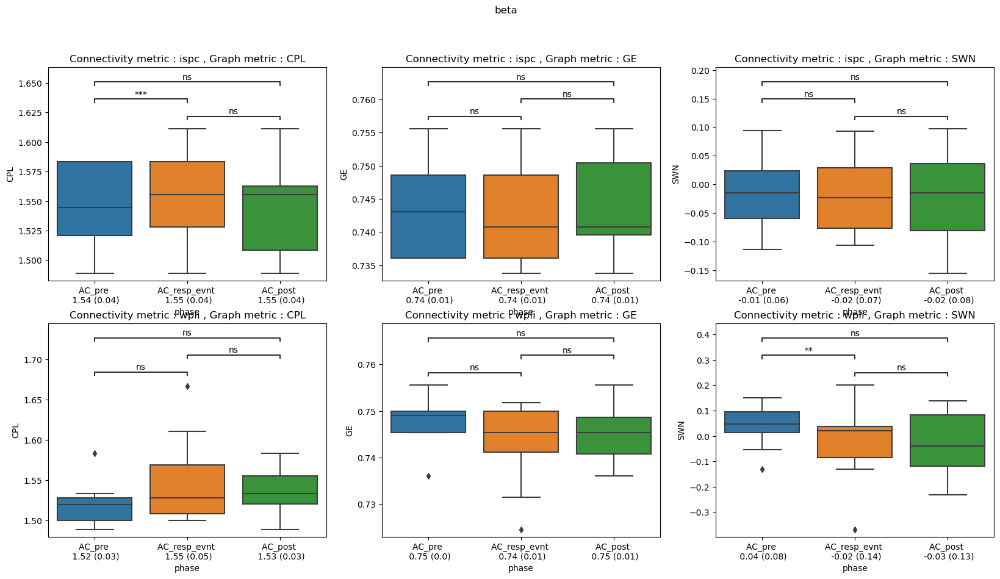

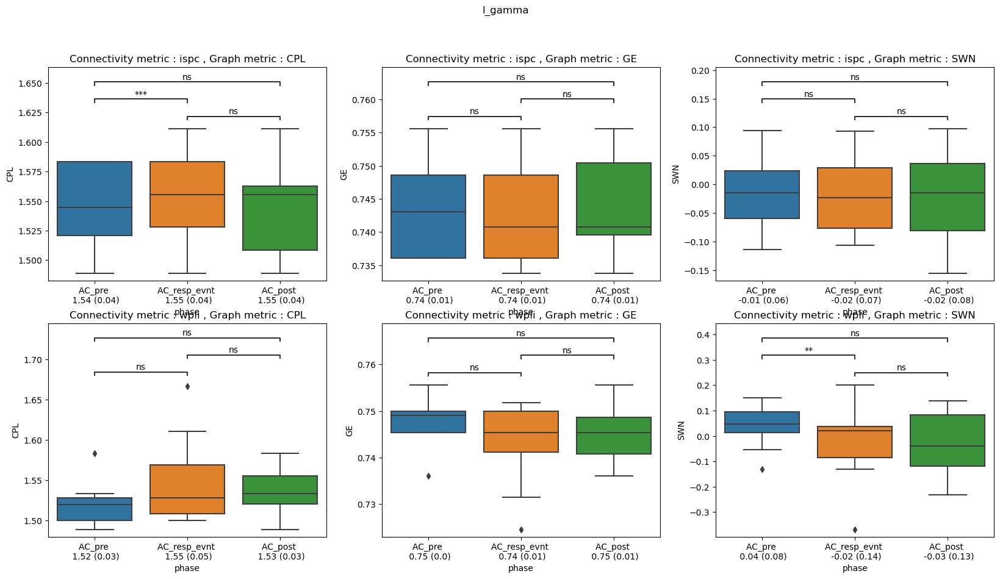

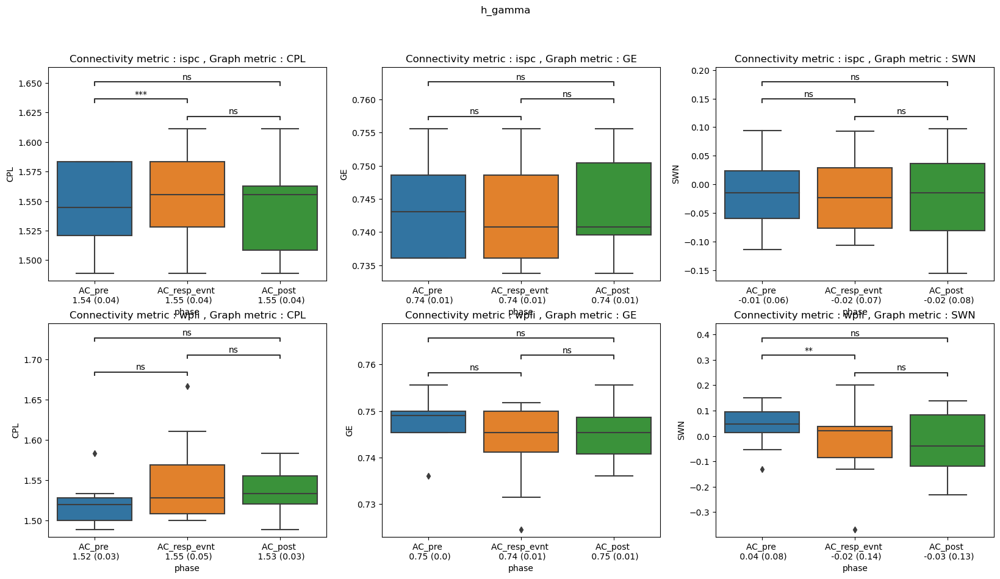

In [550]:
for band in df_DFC_all['band'].unique():
    fig , axs = plt.subplots(nrows = len(metrics), ncols = len(outcomes), figsize = (20,10))
    plt.suptitle(band)
    for row, metric in enumerate(metrics):
        for col, outcome in enumerate(outcomes):
            ax = axs[row, col]
            df = df_DFC_all.query(f"metric == '{metric}' & phase in ['AC_pre', 'AC_resp_evnt', 'AC_post']")
            auto_stats(df=df, predictor = 'phase', outcome = outcome, subject = 'sujet', order = ['AC_pre', 'AC_resp_evnt', 'AC_post'], ax=ax)
            # sns.pointplot(data=df, x = 'phase', y = outcome, ax=ax, hue = 'band')
            # auto_stats(df=df_DFC_all[df_DFC_all['metric'] == metric], predictor = 'cond', outcome = outcome, ax=ax, subject = 'sujet')
            ax.set_title(f'Connectivity metric : {metric} , Graph metric : {outcome}')


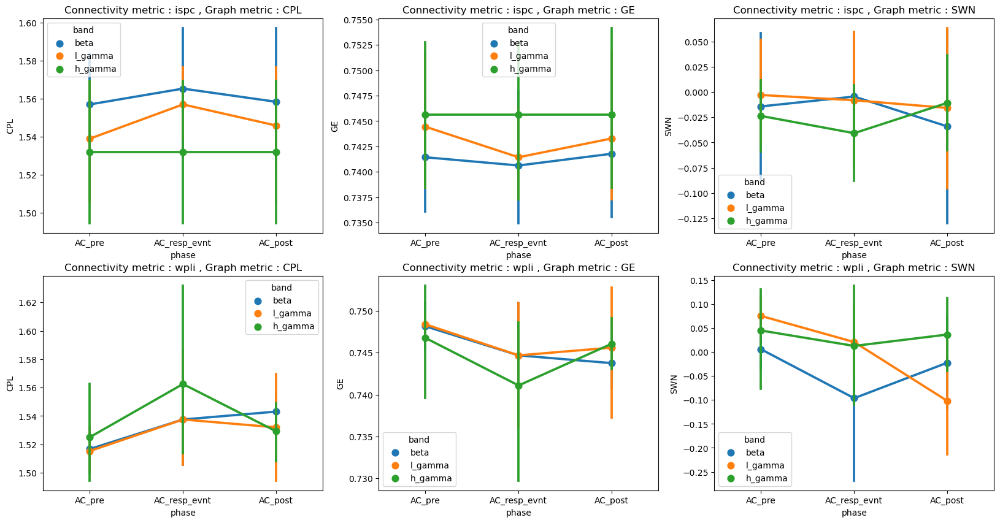

In [461]:
fig , axs = plt.subplots(nrows = len(metrics), ncols = len(outcomes), figsize = (20,10))
for row, metric in enumerate(metrics):
    for col, outcome in enumerate(outcomes):
        ax = axs[row, col]
        df = df_DFC_all.query(f"metric == '{metric}' & phase in ['AC_pre', 'AC_resp_evnt', 'AC_post']")
        sns.pointplot(data=df, x = 'phase', y = outcome, ax=ax, hue = 'band')
        # auto_stats(df=df_DFC_all[df_DFC_all['metric'] == metric], predictor = 'cond', outcome = outcome, ax=ax, subject = 'sujet')
        ax.set_title(f'Connectivity metric : {metric} , Graph metric : {outcome}')

## AL

/home/jules/anaconda3/lib/python3.8/site-packages/scipy/stats/_morestats.py:3145: UserWarning: Exact p-value calculation does not work if there are ties. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/home/jules/anaconda3/lib/python3.8/site-packages/scipy/stats/_morestats.py:3159: UserWarning: Sample size too small for normal approximation.
  warnings.warn("Sample size too small for normal approximation.")
/home/jules/anaconda3/lib/python3.8/site-packages/scipy/stats/_morestats.py:3145: UserWarning: Exact p-value calculation does not work if there are ties. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/home/jules/anaconda3/lib/python3.8/site-packages/scipy/stats/_morestats.py:3159: UserWarning: Sample size too small for normal approximation.
  warnings.warn("Sample size too small for normal approximation.")
/home/jules/anaconda3/lib/python3.8/site-packages/scipy/st

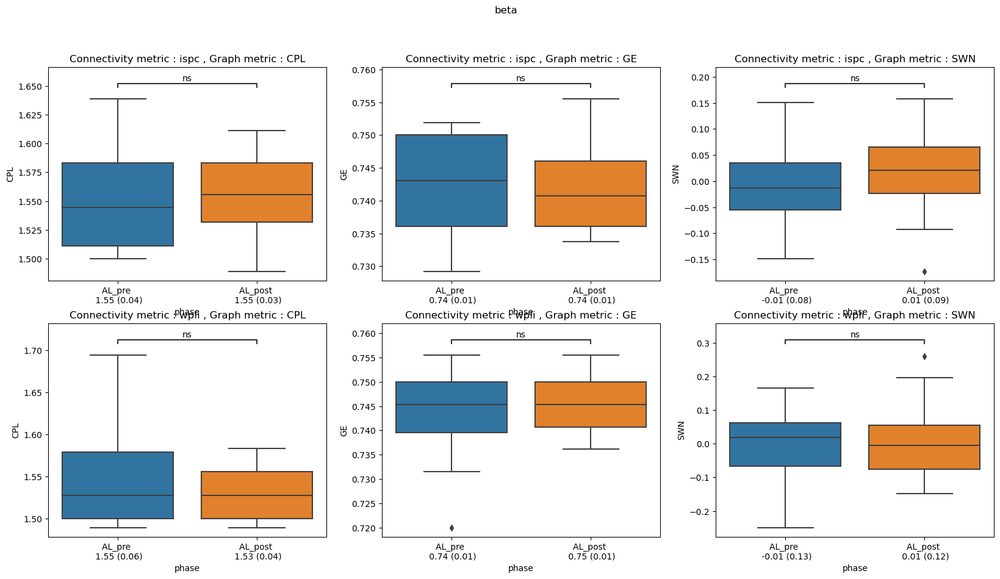

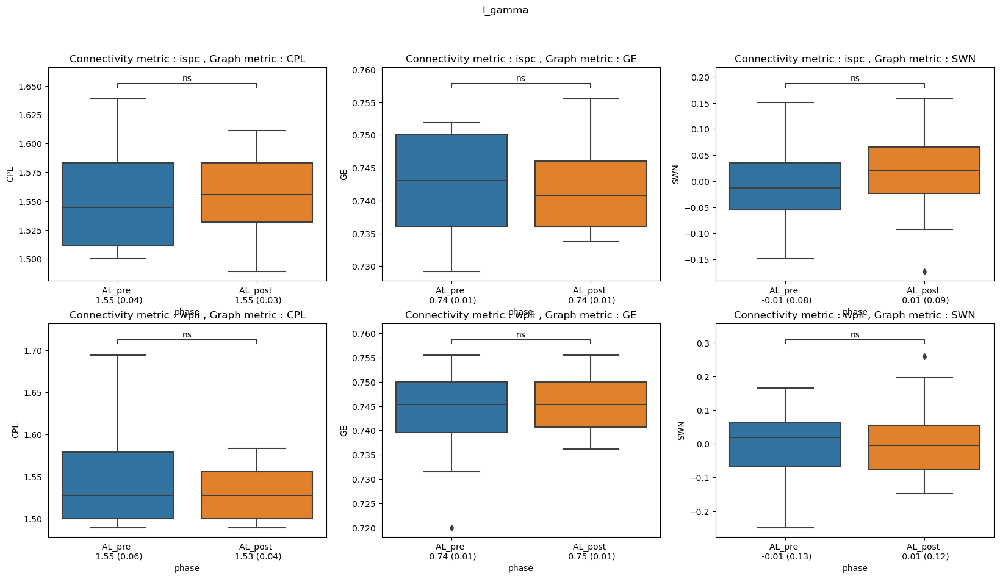

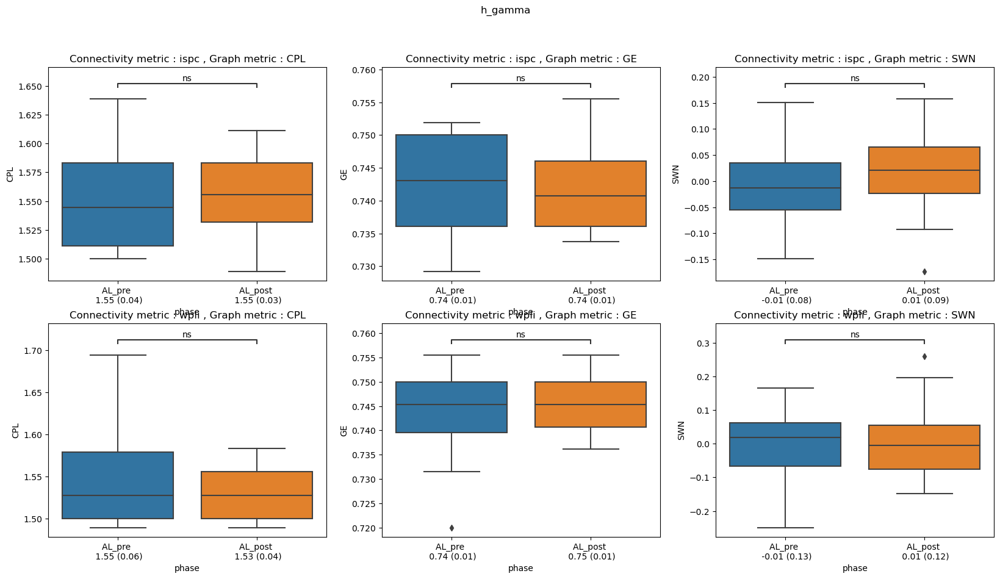

In [551]:
for band in df_DFC_all['band'].unique():
    fig , axs = plt.subplots(nrows = len(metrics), ncols = len(outcomes), figsize = (20,10))
    plt.suptitle(band)
    for row, metric in enumerate(metrics):
        for col, outcome in enumerate(outcomes):
            ax = axs[row, col]
            df = df_DFC_all.query(f"metric == '{metric}' & phase in ['AL_pre', 'AL_post']")
            auto_stats(df=df, predictor = 'phase', outcome = outcome, subject = 'sujet', order = ['AL_pre', 'AL_post'], ax=ax)
            # sns.pointplot(data=df, x = 'phase', y = outcome, ax=ax, hue = 'band')
            # auto_stats(df=df_DFC_all[df_DFC_all['metric'] == metric], predictor = 'cond', outcome = outcome, ax=ax, subject = 'sujet')
            ax.set_title(f'Connectivity metric : {metric} , Graph metric : {outcome}')

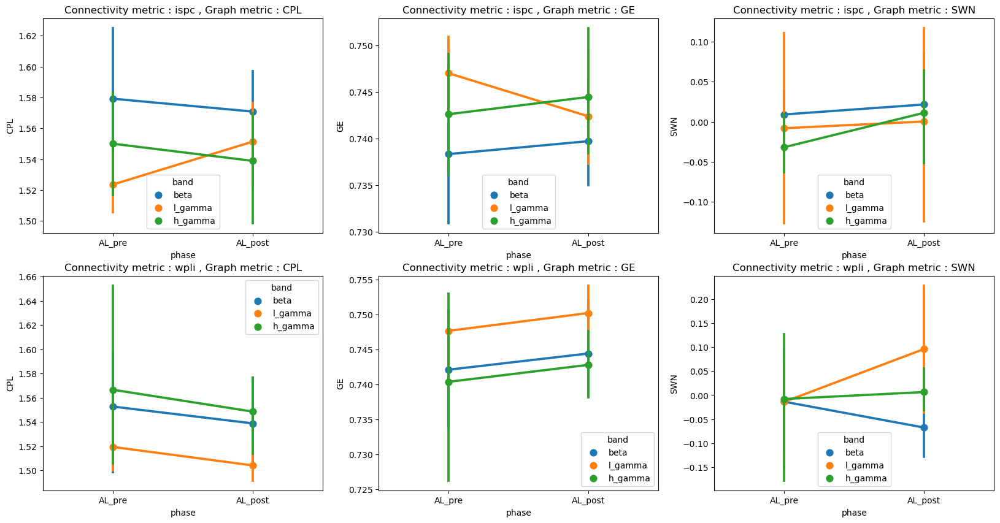

In [399]:
fig , axs = plt.subplots(nrows = len(metrics), ncols = len(outcomes), figsize = (20,10))
for row, metric in enumerate(metrics):
    for col, outcome in enumerate(outcomes):
        ax = axs[row, col]
        df = df_DFC_all.query(f"metric == '{metric}' & phase in ['AL_pre', 'AL_post']")
        sns.pointplot(data=df, x = 'phase', y = outcome, ax=ax, hue = 'band')
        # auto_stats(df=df_DFC_all[df_DFC_all['metric'] == metric], predictor = 'cond', outcome = outcome, ax=ax, subject = 'sujet')
        ax.set_title(f'Connectivity metric : {metric} , Graph metric : {outcome}')

# DFC

In [466]:
df_raw_DFC = pd.read_excel('allplot_df_DFC.xlsx', index_col = 0).drop(columns = 'Unnamed: 0')

In [467]:
metrics = df_raw_DFC['metric'].unique()
outcome = 'value'


In [468]:
df_raw_DFC['phase'] = [f'{cond_i}_{phase_i}' for phase_i, cond_i in zip(df_raw_DFC['phase'], df_raw_DFC['cond']) ]
df_raw_DFC_all = df_raw_DFC.drop(['cond'], axis=1)
df_raw_DFC_all

,sujet,band,metric,phase,pair,value
0,pat_03083_1527,beta,ispc,SNIFF_whole,amygdala-parahippocampique,0.431929
1,pat_03083_1527,beta,ispc,SNIFF_pre,amygdala-parahippocampique,0.436535
2,pat_03083_1527,beta,ispc,SNIFF_resp_evnmt,amygdala-parahippocampique,0.432971
3,pat_03083_1527,beta,ispc,SNIFF_post,amygdala-parahippocampique,0.427446
4,pat_03083_1527,beta,ispc,SNIFF_whole,amygdala-parahippocampique,0.449004
...,...,...,...,...,...,...
1723,pat_03138_1601,h_gamma,wpli,AC_whole,amygdala-hippocampus,-0.016424
1724,pat_03138_1601,h_gamma,wpli,AC_pre,amygdala-hippocampus,-0.007578
1725,pat_03138_1601,h_gamma,wpli,AC_resp_evnmt_1,amygdala-hippocampus,0.006677
1726,pat_03138_1601,h_gamma,wpli,AC_resp_evnmt_2,amygdala-hippocampus,-0.033780


In [622]:
def clean_df_dfc(df):
    df_clean = pd.DataFrame(columns=df.columns)

    pair_unique_clean = []
    pair_unique_pre = df['pair'].unique()
    for pair_i in pair_unique_pre:
        if len(pair_unique_clean) != 0:
            pair_i_rev = f"{pair_i.split('-')[1]}-{pair_i.split('-')[0]}"
            if pair_i not in pair_unique_clean and pair_i_rev not in pair_unique_clean:
                pair_unique_clean.append(pair_i)
        else:
            pair_unique_clean.append(pair_i)
    
    for index_i in np.arange(df.index.shape[0]):
        pair_pre = df.iloc[index_i,:]['pair']
        for pair_ref_i in pair_unique_clean:
            if pair_pre == pair_ref_i:
                pair_corrected = pair_ref_i
                break
            pair_ref_i_rev = f"{pair_ref_i.split('-')[1]}-{pair_ref_i.split('-')[0]}"
            if pair_pre == pair_ref_i_rev:
                pair_corrected = pair_ref_i

        df_to_concat = pd.DataFrame.from_dict( {key : [value] for value, key in zip(df.iloc[index_i,:].values, df.iloc[index_i,:].index)} )
        df_to_concat['pair'] = pair_corrected
                
        df_clean = pd.concat([df_clean, df_to_concat])
    
    return df_clean

## WPLI

### AC

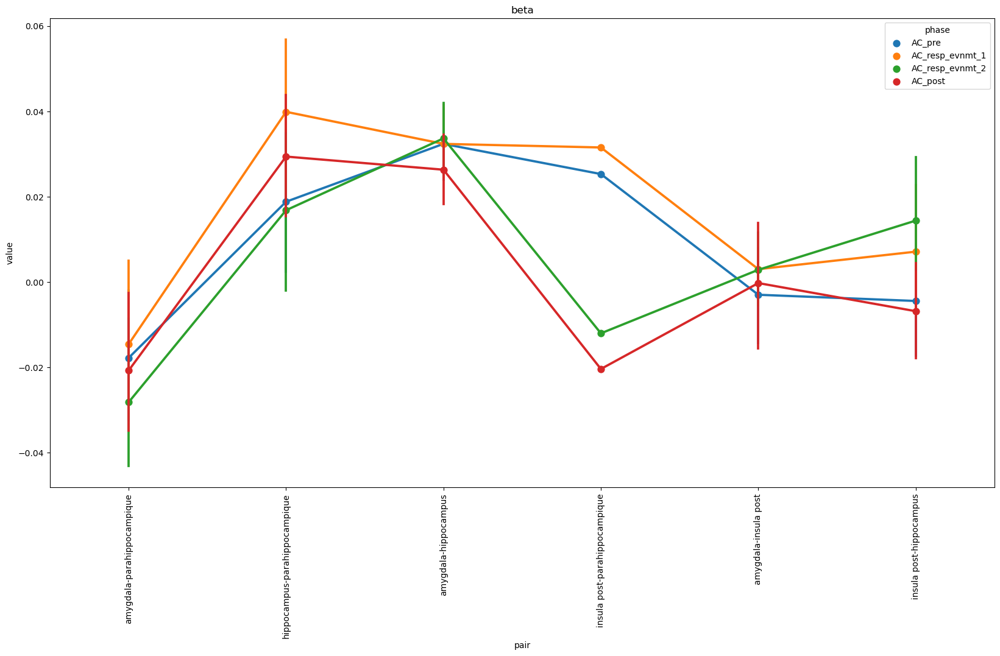

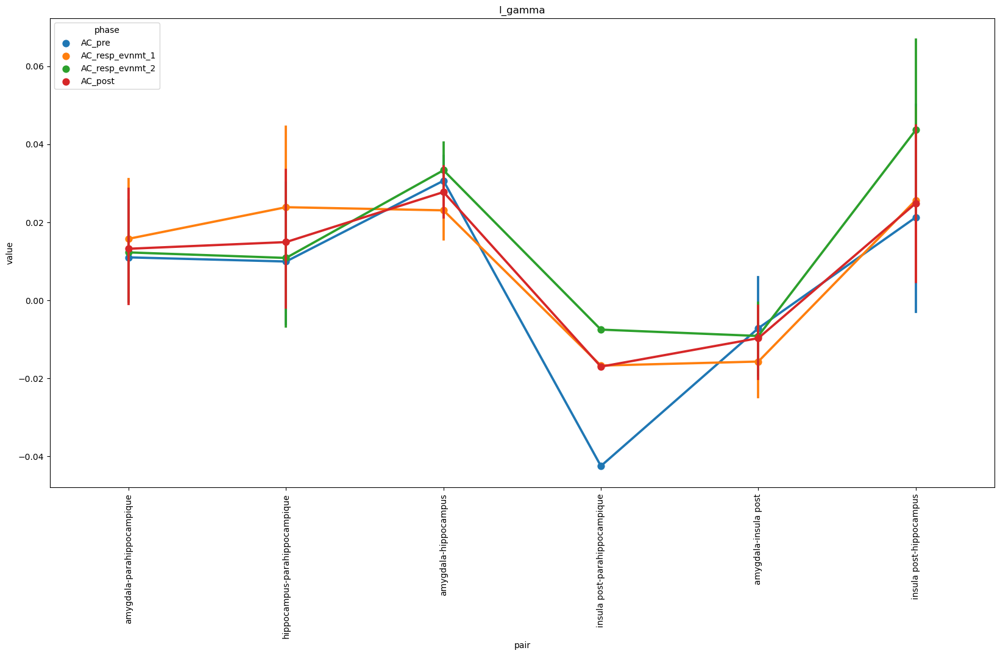

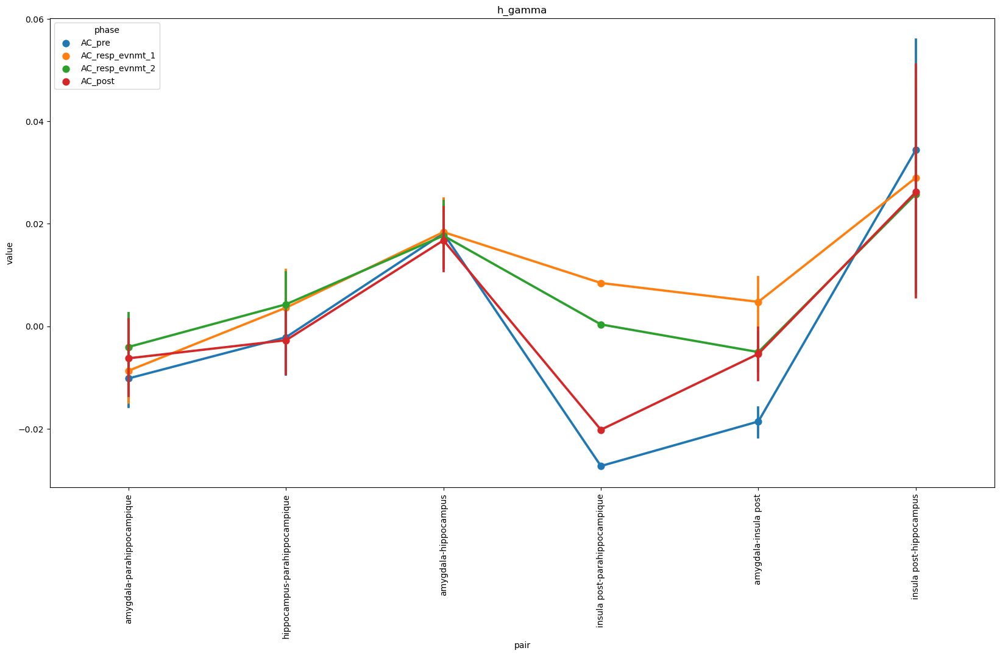

In [625]:
for band in df_raw_DFC_all['band'].unique():
    df = df_raw_DFC_all.query(f"band == '{band}' & metric == 'wpli' & phase in ['AC_pre', 'AC_resp_evnmt_1','AC_resp_evnmt_2', 'AC_post']")
    df = clean_df_dfc(df)
    fig, ax = plt.subplots(figsize = (20,10))
    # sns.barplot(data=df, y='pair', x = 'value', hue = 'phase', orient = 'h', ax=ax, hue_order = ['AC_pre', 'AC_resp_evnmt_1','AC_resp_evnmt_2', 'AC_post'])
    sns.pointplot(data=df, x = 'pair', y = 'value', hue = 'phase',ax=ax, hue_order = ['AC_pre', 'AC_resp_evnmt_1','AC_resp_evnmt_2', 'AC_post'])
    # ax.bar_label(container=ax.containers[0], labels=mapper_n_rois.values())
    ax.set_title(band)
    ax.tick_params(axis='x', rotation=90)


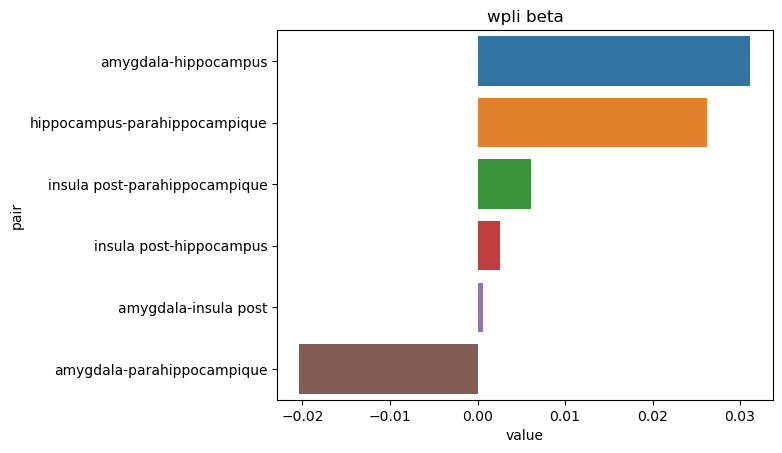

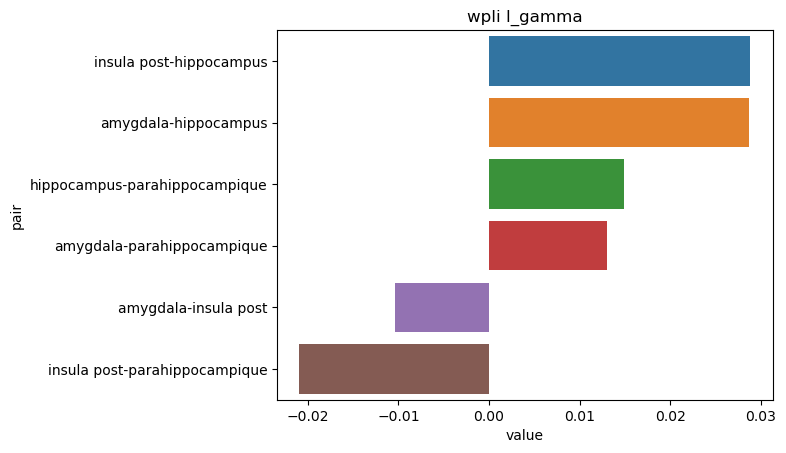

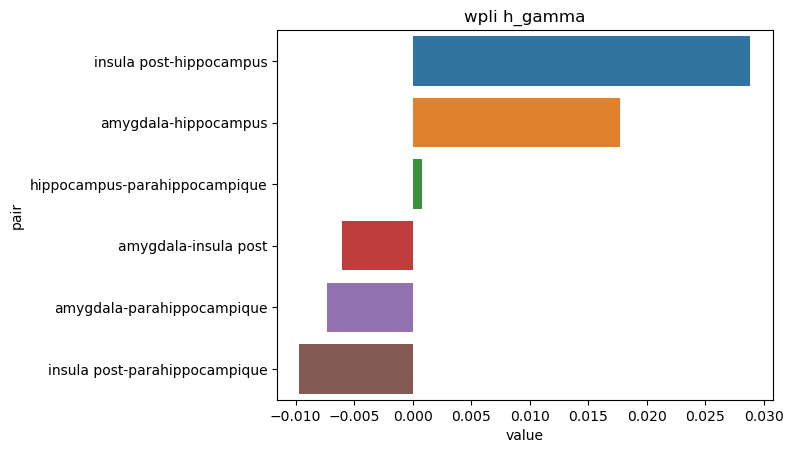

In [660]:
for band in df_raw_DFC_all['band'].unique():
    df = df_raw_DFC_all.query(f"metric == 'wpli' and phase in ['AC_pre', 'AC_resp_evnmt_1','AC_resp_evnmt_2', 'AC_post'] and band == '{band}'")
    df = clean_df_dfc(df).groupby('pair').mean().sort_values(by = 'value', ascending = False).reset_index()
    sns.barplot(data=df, x='value', y='pair', orient = 'h')
    plt.title(f'wpli {band}')
    plt.show()

### SNIFF

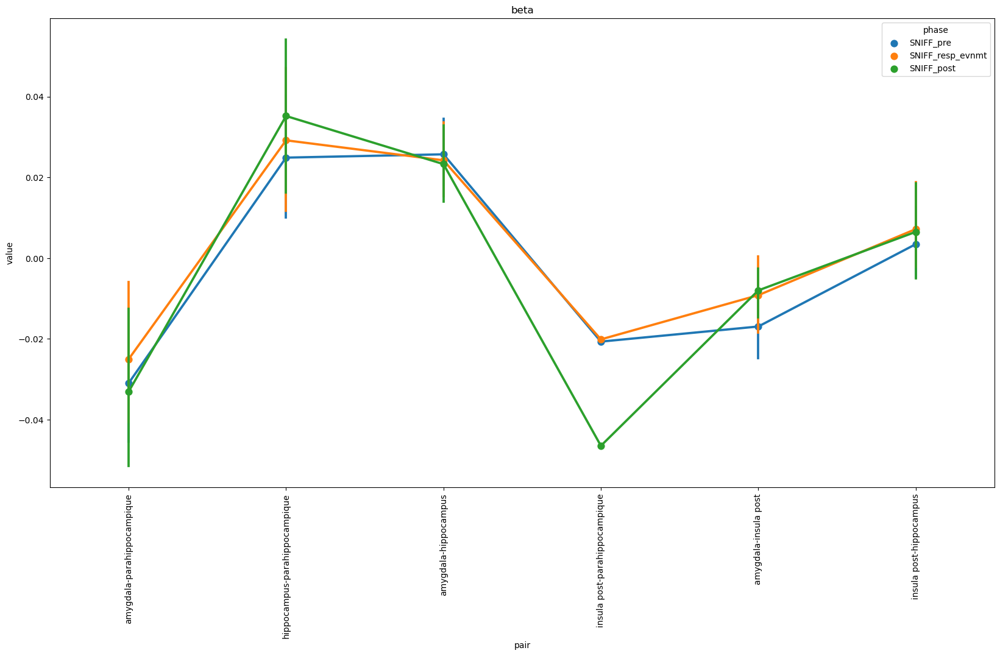

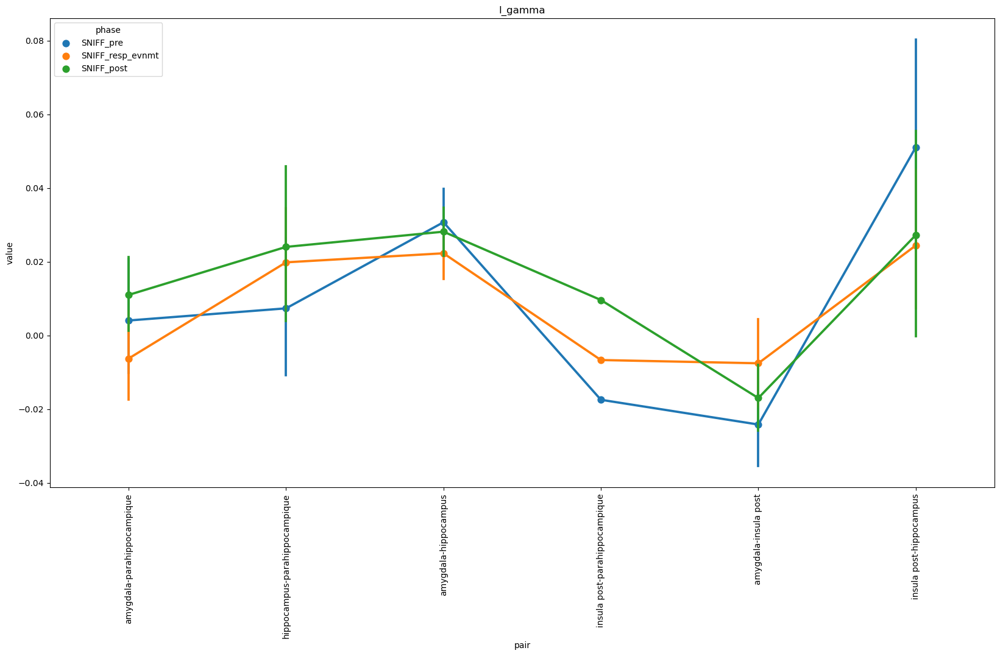

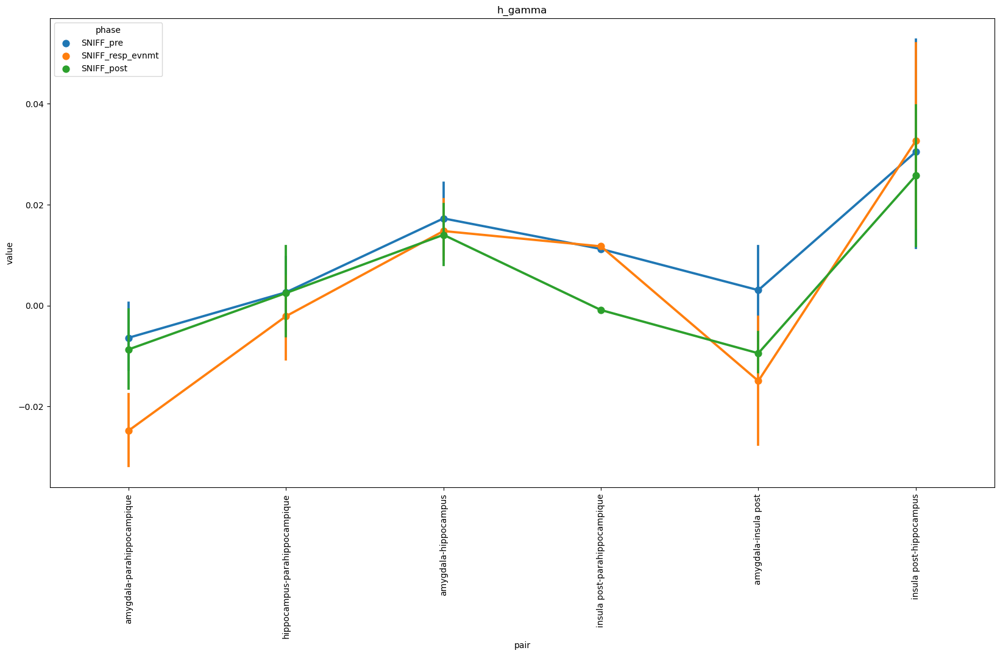

In [627]:
for band in df_raw_DFC_all['band'].unique():
    df = df_raw_DFC_all.query(f"band == '{band}' & metric == 'wpli' & phase in ['SNIFF_pre', 'SNIFF_resp_evnmt', 'SNIFF_post']")
    df = clean_df_dfc(df)
    fig, ax = plt.subplots(figsize = (20,10))
    # sns.barplot(data=df, y='pair', x = 'value', hue = 'phase', orient = 'h', ax=ax, hue_order = ['AC_pre', 'AC_resp_evnmt', 'AC_post'])
    sns.pointplot(data=df, x = 'pair', y = 'value', hue = 'phase',ax=ax, hue_order = ['SNIFF_pre', 'SNIFF_resp_evnmt', 'SNIFF_post'])
    # ax.bar_label(container=ax.containers[0], labels=mapper_n_rois.values())
    ax.set_title(band)
    ax.tick_params(axis='x', rotation=90)

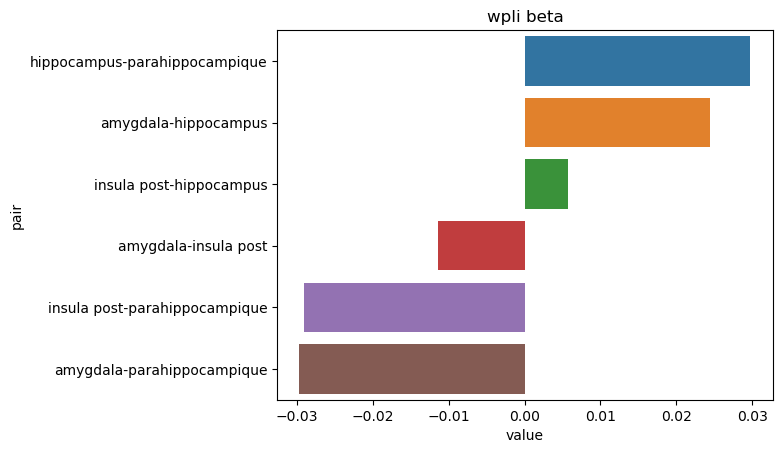

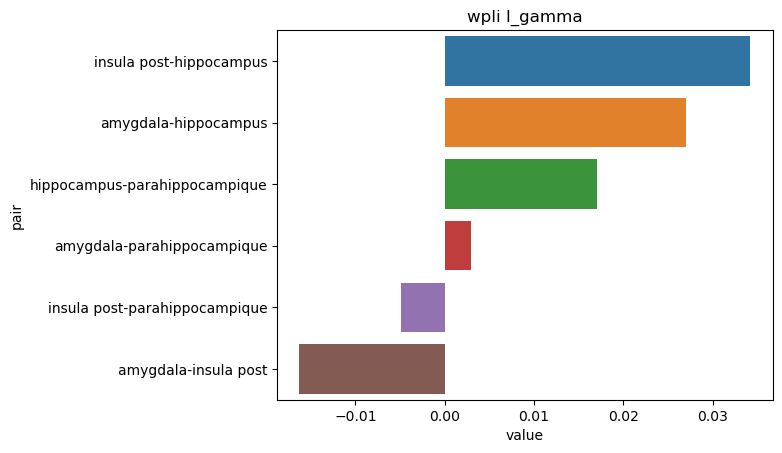

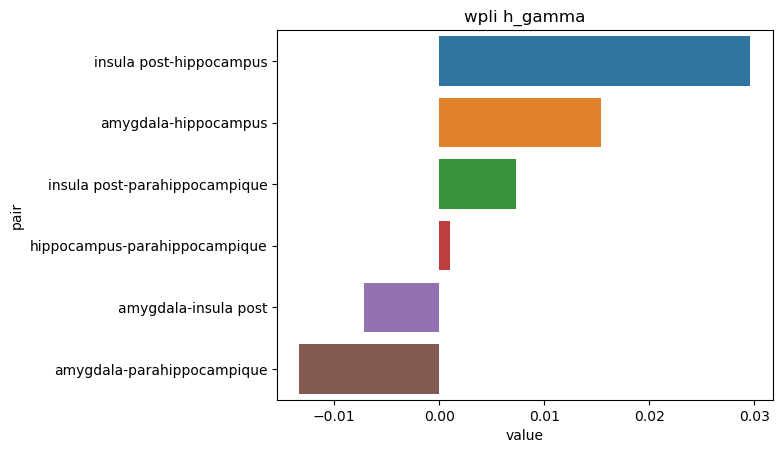

In [661]:
for band in df_raw_DFC_all['band'].unique():
    df = df_raw_DFC_all.query(f"metric == 'wpli' and phase in ['SNIFF_pre', 'SNIFF_resp_evnmt', 'SNIFF_post'] and band == '{band}'")
    df = clean_df_dfc(df).groupby('pair').mean().sort_values(by = 'value', ascending = False).reset_index()
    sns.barplot(data=df, x='value', y='pair', orient = 'h')
    plt.title(f'wpli {band}')
    plt.show()

### AL

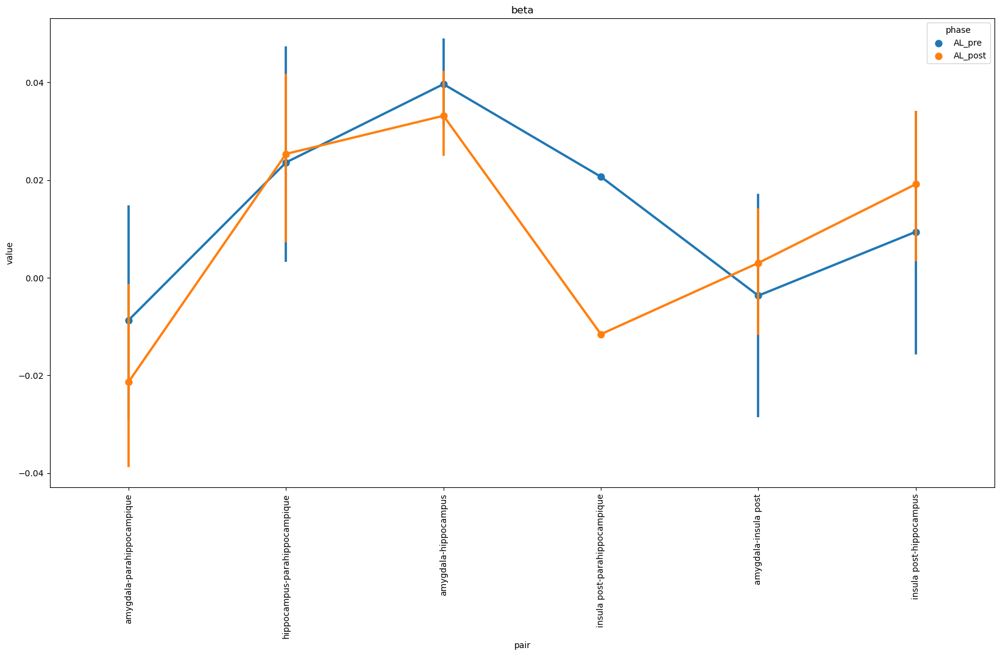

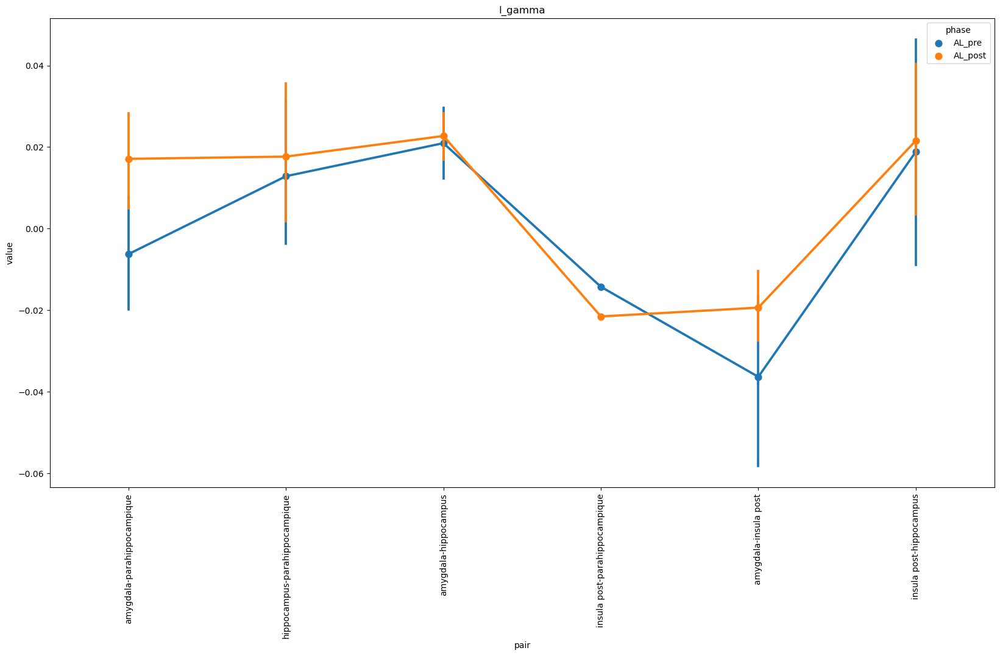

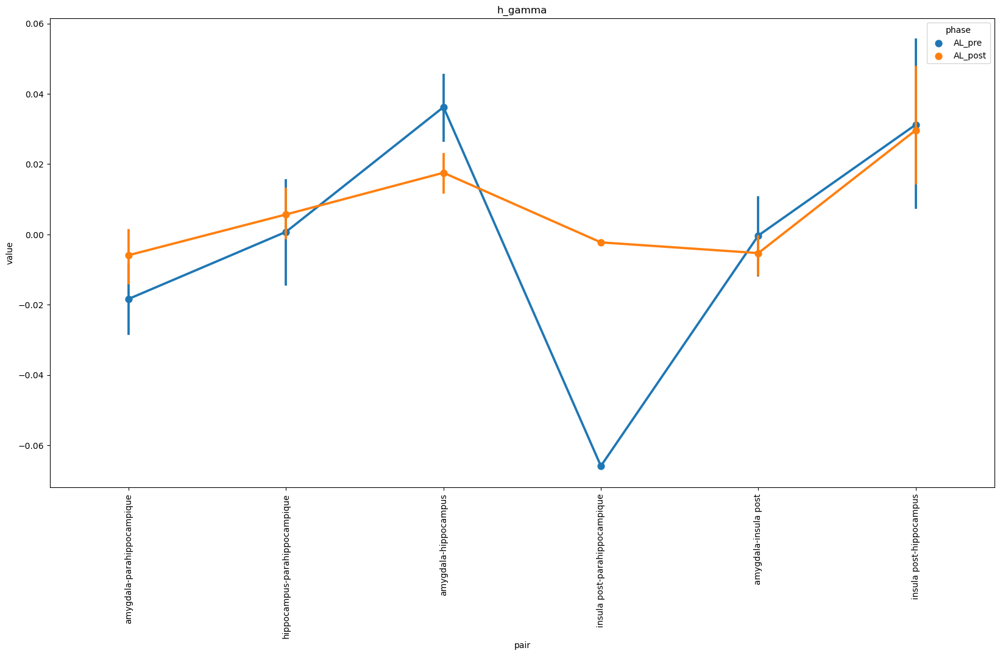

In [628]:
for band in df_raw_DFC_all['band'].unique():
    df = df_raw_DFC_all.query(f"band == '{band}' & metric == 'wpli' & phase in ['AL_pre', 'AL_post']")
    df = clean_df_dfc(df)
    fig, ax = plt.subplots(figsize = (20,10))
    # sns.barplot(data=df, y='pair', x = 'value', hue = 'phase', orient = 'h', ax=ax, hue_order = ['AC_pre', 'AC_resp_evnmt', 'AC_post'])
    sns.pointplot(data=df, x = 'pair', y = 'value', hue = 'phase',ax=ax, hue_order = ['AL_pre', 'AL_post'])
    # ax.bar_label(container=ax.containers[0], labels=mapper_n_rois.values())
    ax.set_title(band)
    ax.tick_params(axis='x', rotation=90)

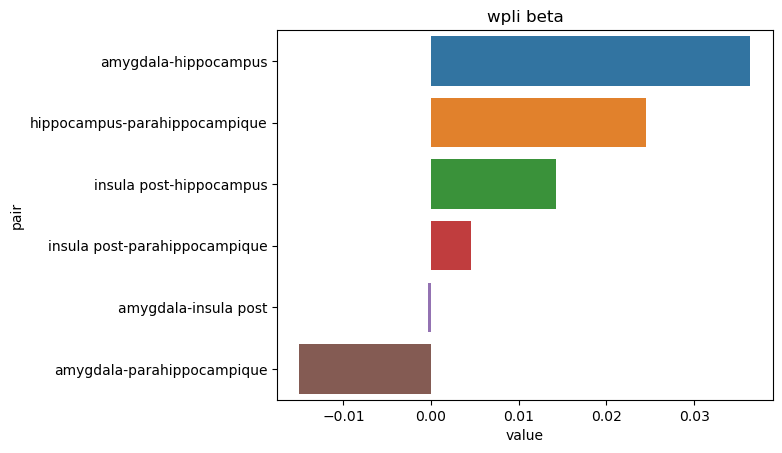

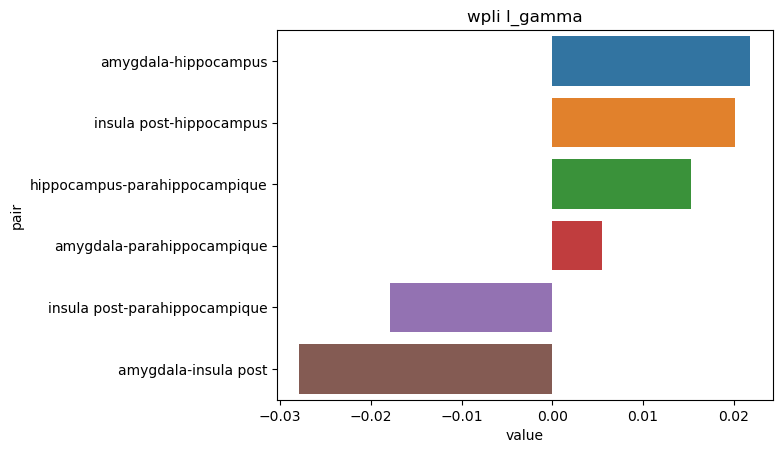

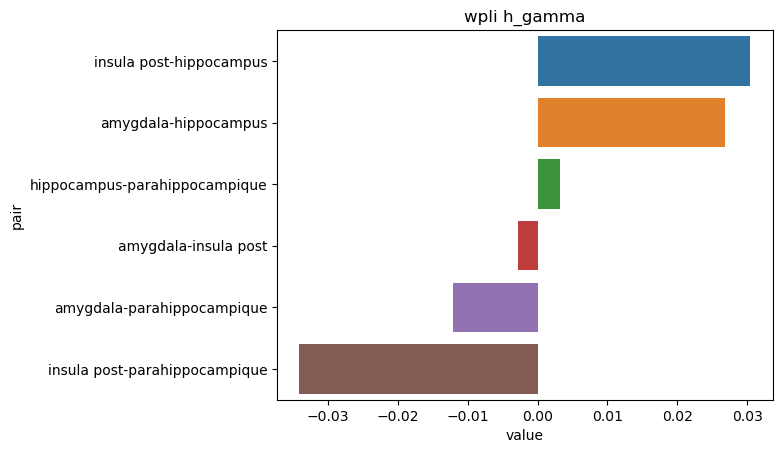

In [662]:
for band in df_raw_DFC_all['band'].unique():
    df = df_raw_DFC_all.query(f"metric == 'wpli' and phase in ['AL_pre', 'AL_post'] and band == '{band}'")
    df = clean_df_dfc(df).groupby('pair').mean().sort_values(by = 'value', ascending = False).reset_index()
    sns.barplot(data=df, x='value', y='pair', orient = 'h')
    plt.title(f'wpli {band}')
    plt.show()

## ISPC

### AL

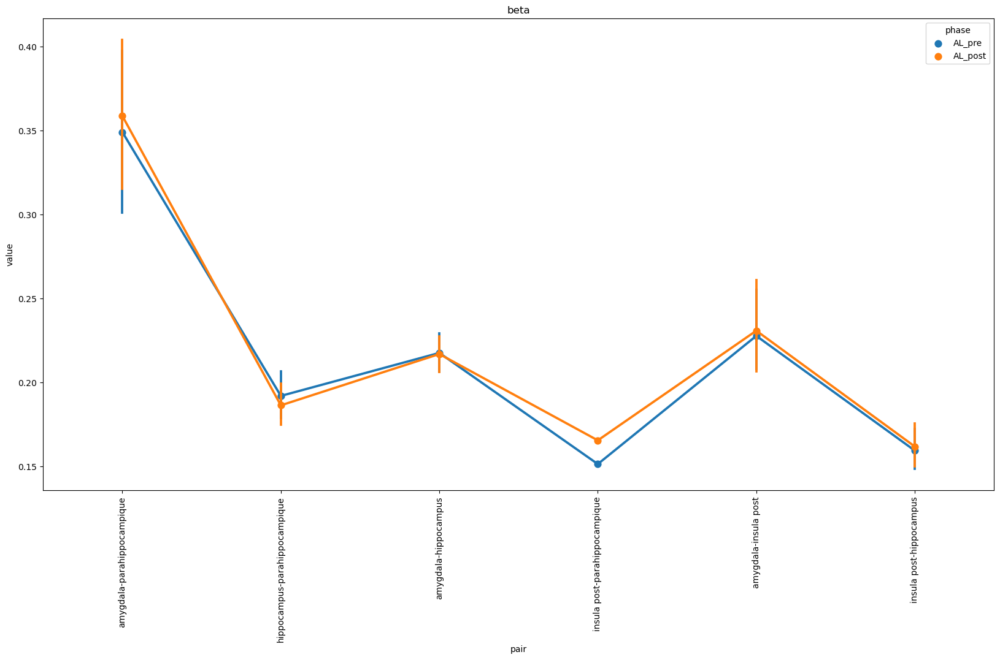

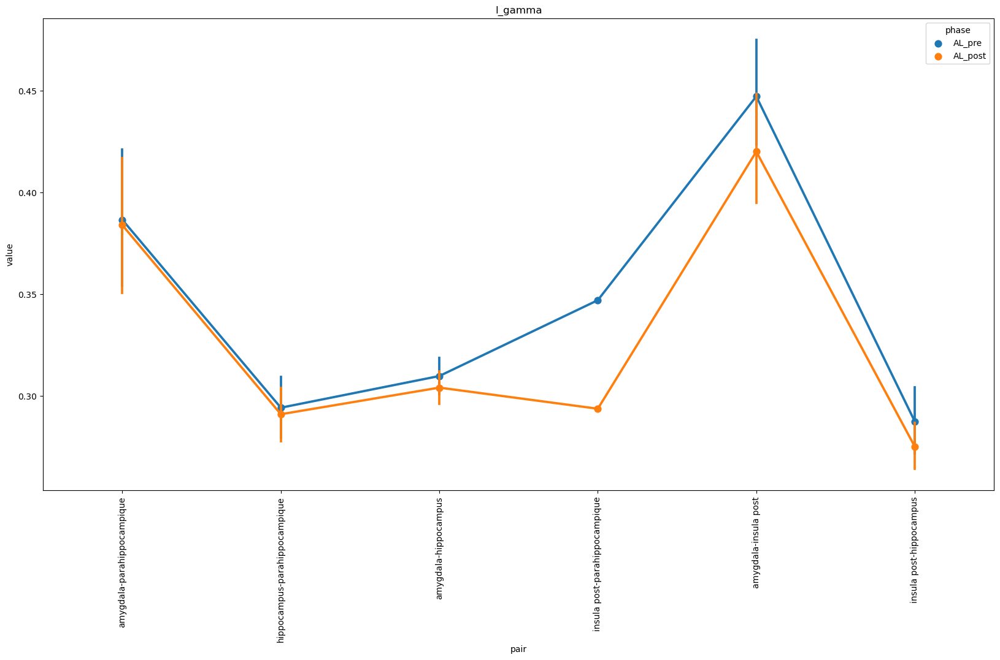

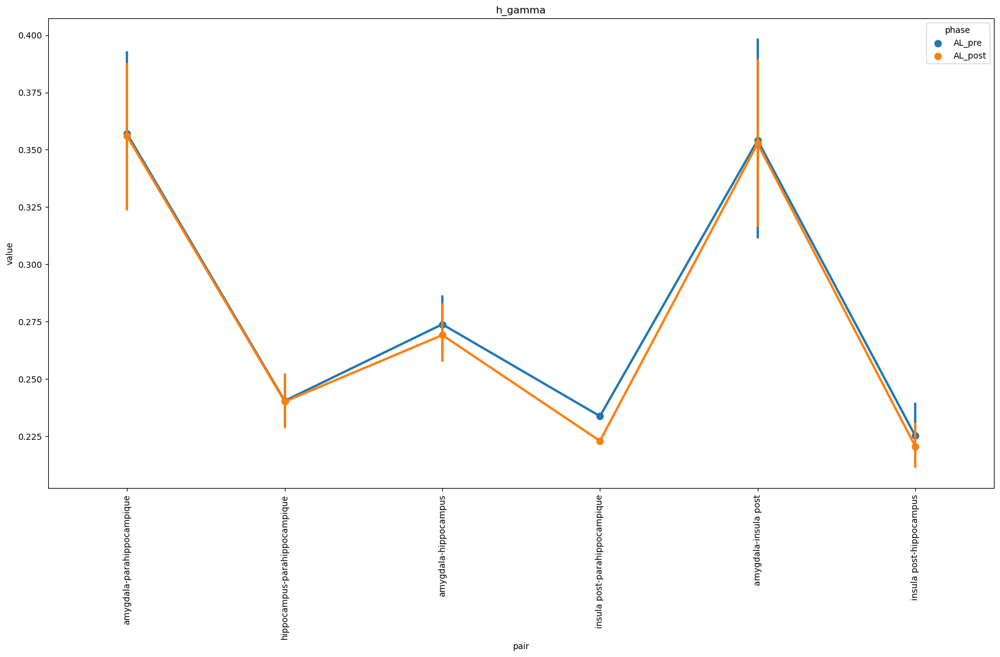

In [631]:
for band in df_raw_DFC_all['band'].unique():
    df = df_raw_DFC_all.query(f"band == '{band}' & metric == 'ispc' & phase in ['AL_pre', 'AL_post']")
    df = clean_df_dfc(df)
    fig, ax = plt.subplots(figsize = (20,10))
    # sns.barplot(data=df, y='pair', x = 'value', hue = 'phase', orient = 'h', ax=ax, hue_order = ['AL_pre', 'AL_post'])
    sns.pointplot(data=df, x = 'pair', y = 'value', hue = 'phase',ax=ax, hue_order = ['AL_pre', 'AL_post'])
    # ax.bar_label(container=ax.containers[0], labels=mapper_n_rois.values())
    ax.set_title(band)
    ax.tick_params(axis='x', rotation=90)

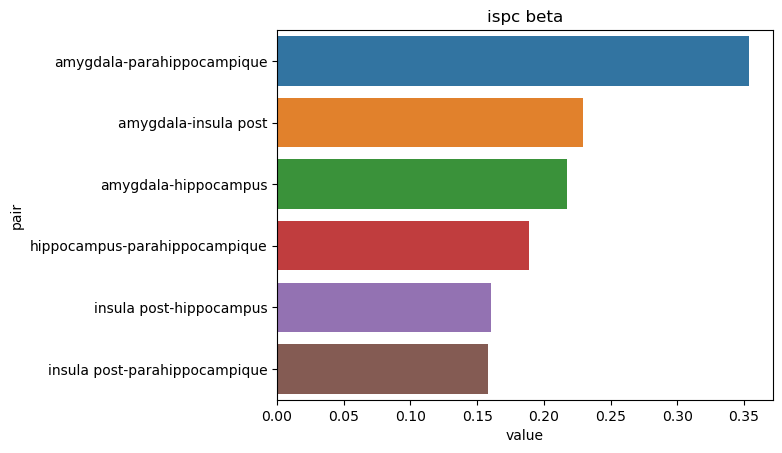

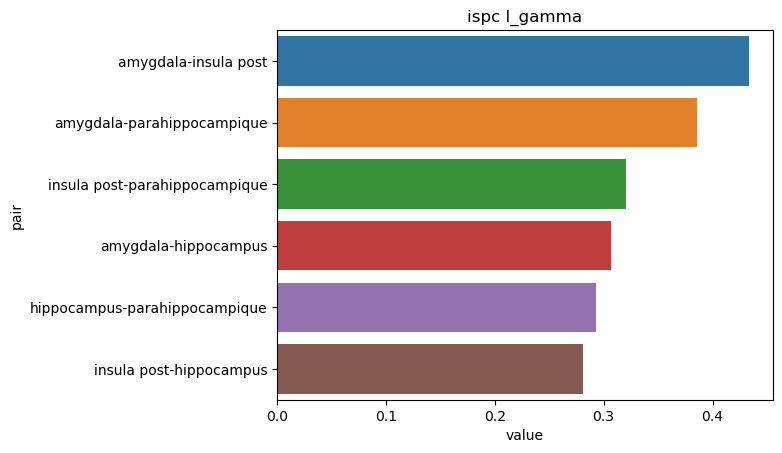

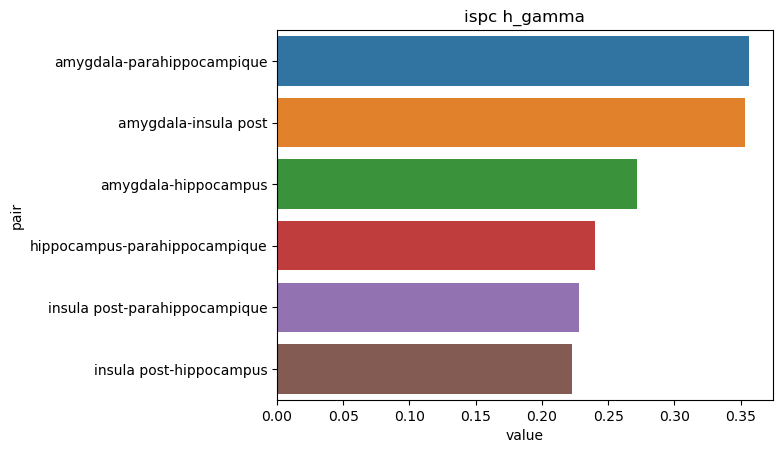

In [657]:
for band in df_raw_DFC_all['band'].unique():
    df = df_raw_DFC_all.query(f"metric == 'ispc' and phase in ['AL_pre', 'AL_post'] and band == '{band}'")
    df = clean_df_dfc(df).groupby('pair').mean().sort_values(by = 'value', ascending = False).reset_index()
    sns.barplot(data=df, x='value', y='pair', orient = 'h')
    plt.title(f'ispc {band}')
    plt.show()

### AC

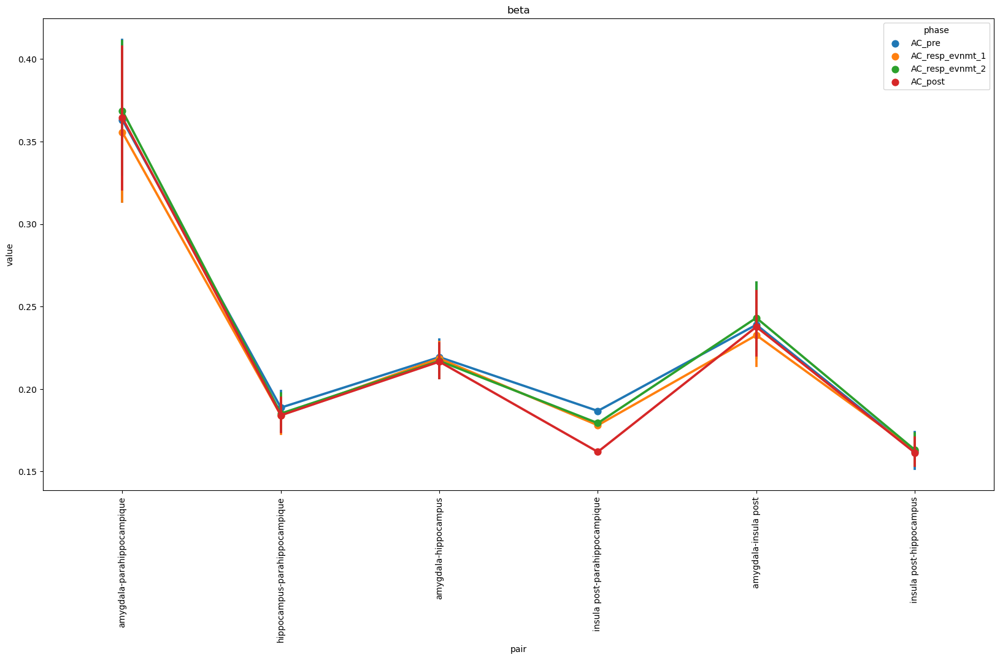

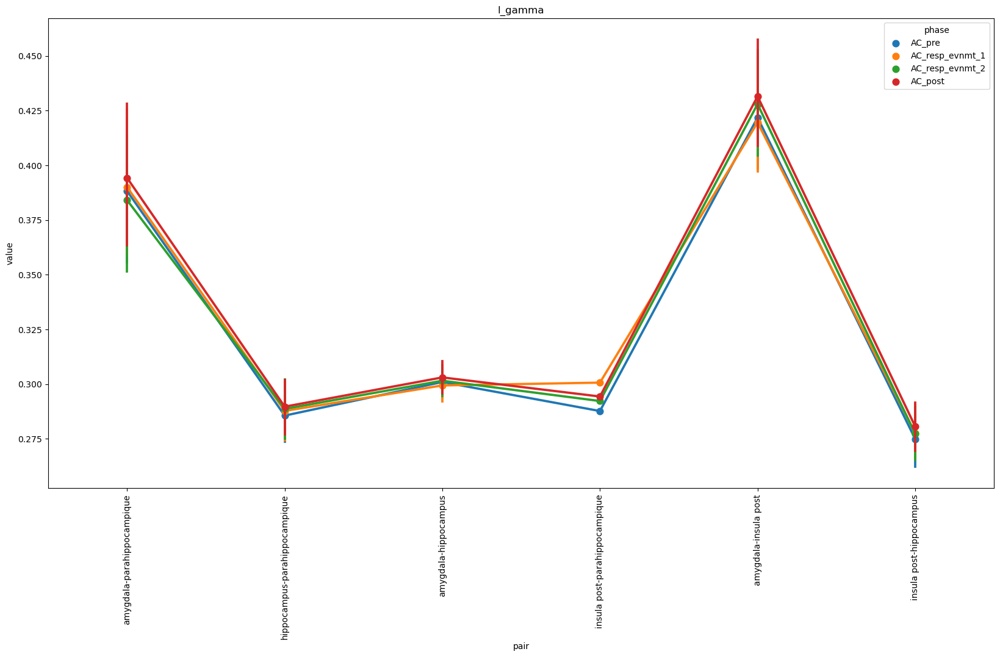

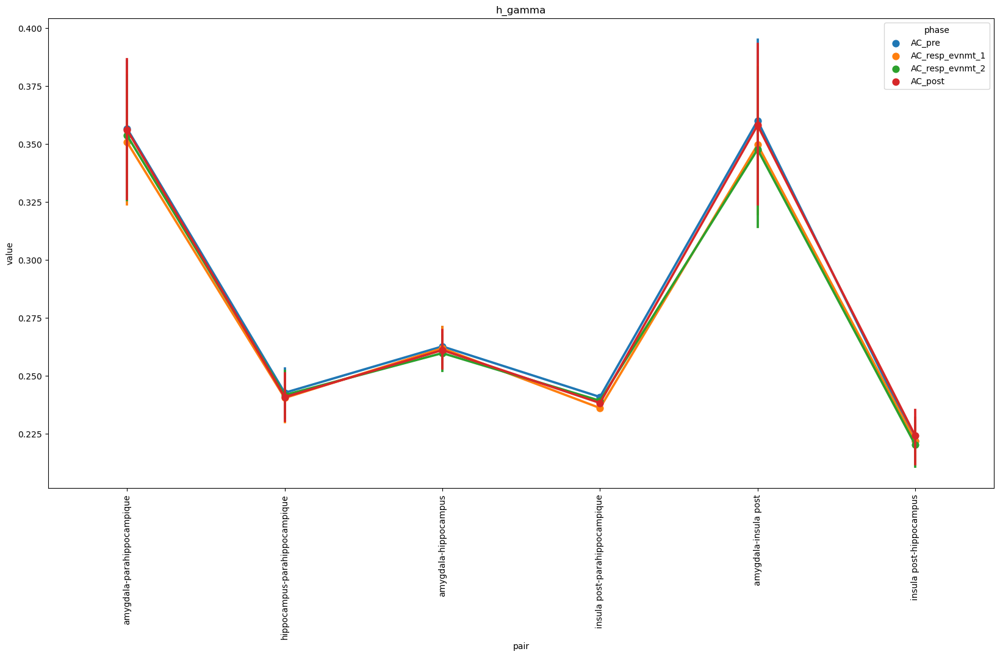

In [630]:
for band in df_raw_DFC_all['band'].unique():
    df = df_raw_DFC_all.query(f"band == '{band}' & metric == 'ispc' & phase in ['AC_pre', 'AC_resp_evnmt_1','AC_resp_evnmt_2', 'AC_post']")
    df = clean_df_dfc(df)
    fig, ax = plt.subplots(figsize = (20,10))
    # sns.barplot(data=df, y='pair', x = 'value', hue = 'phase', orient = 'h', ax=ax, hue_order = ['AC_pre', 'AC_resp_evnmt_1','AC_resp_evnmt_2', 'AC_post'])
    sns.pointplot(data=df, x = 'pair', y = 'value', hue = 'phase',ax=ax, hue_order = ['AC_pre', 'AC_resp_evnmt_1','AC_resp_evnmt_2', 'AC_post'])
    # ax.bar_label(container=ax.containers[0], labels=mapper_n_rois.values())
    ax.set_title(band)
    ax.tick_params(axis='x', rotation=90)


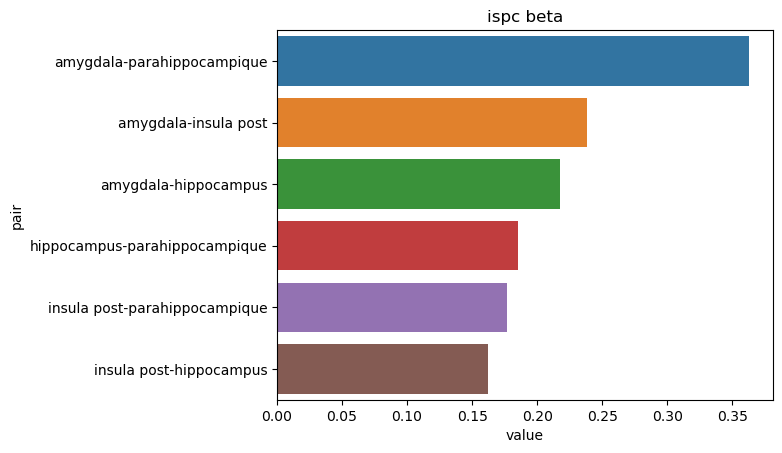

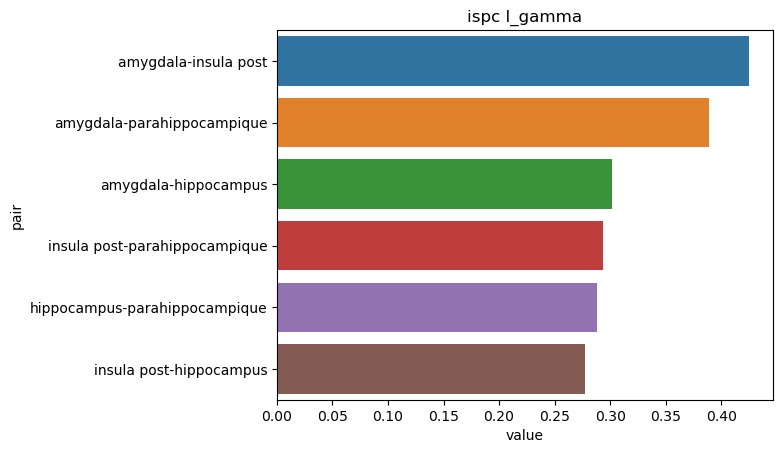

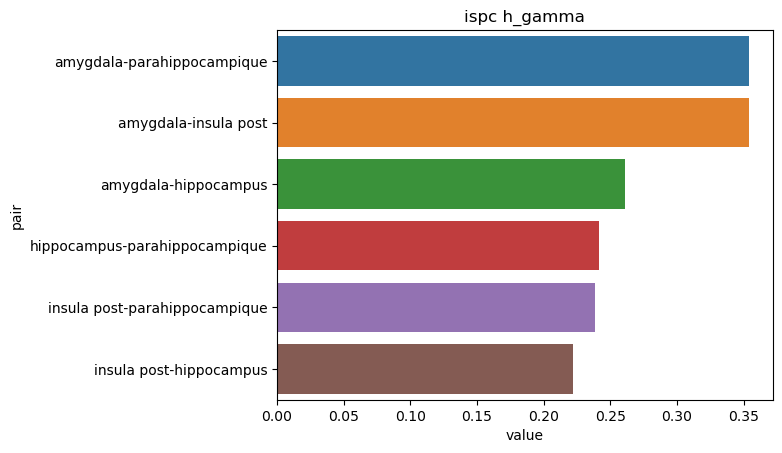

In [658]:
for band in df_raw_DFC_all['band'].unique():
    df = df_raw_DFC_all.query(f"metric == 'ispc' and phase in ['AC_pre', 'AC_resp_evnmt_1', 'AC_resp_evnmt_2', 'AC_post'] and band == '{band}'")
    df = clean_df_dfc(df).groupby('pair').mean().sort_values(by = 'value', ascending = False).reset_index()
    sns.barplot(data=df, x='value', y='pair', orient = 'h')
    plt.title(f'ispc {band}')
    plt.show()

### SNIFF

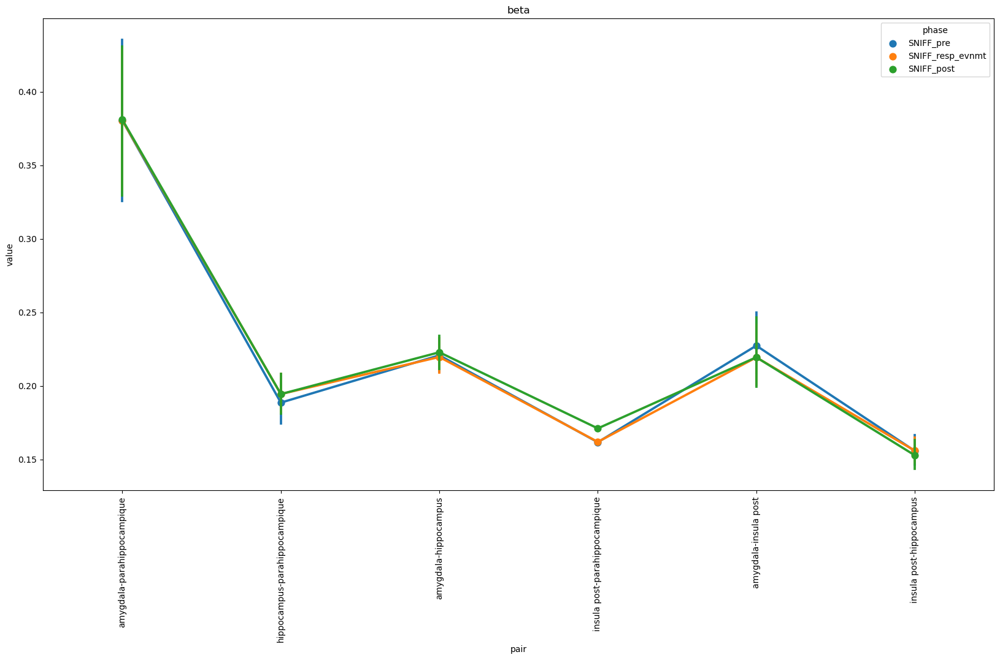

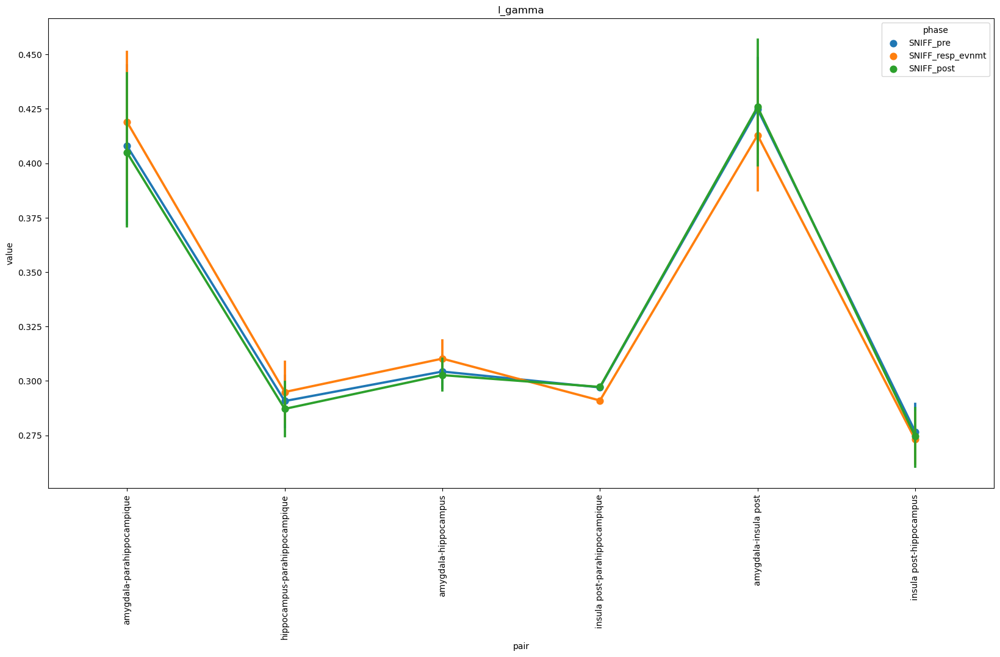

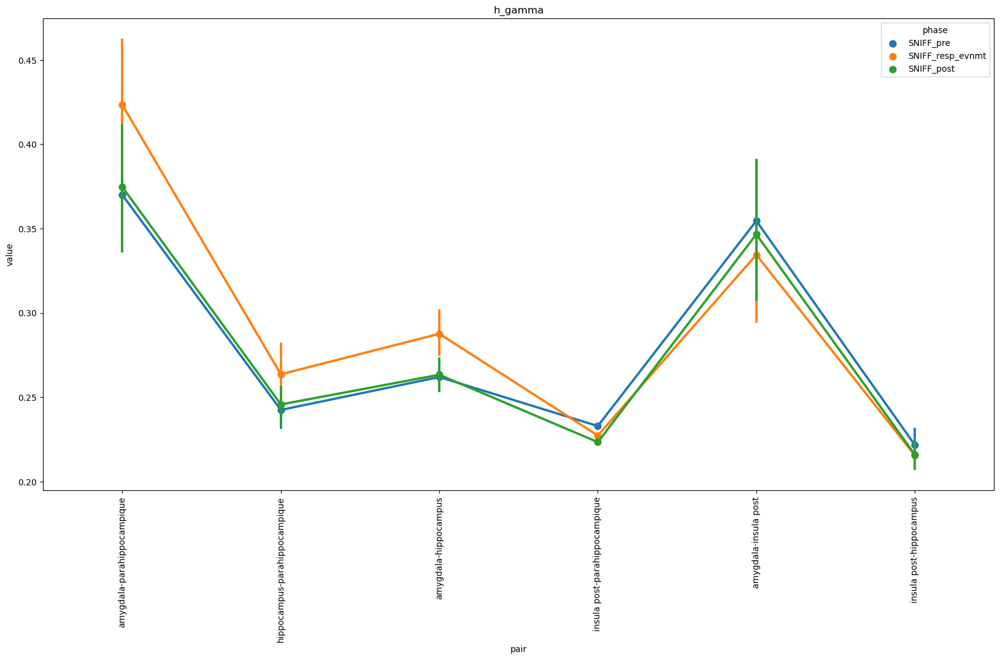

In [632]:
for band in df_raw_DFC_all['band'].unique():
    df = df_raw_DFC_all.query(f"band == '{band}' & metric == 'ispc' & phase in ['SNIFF_pre', 'SNIFF_resp_evnmt', 'SNIFF_post']")
    df = clean_df_dfc(df)
    fig, ax = plt.subplots(figsize = (20,10))
    # sns.barplot(data=df, y='pair', x = 'value', hue = 'phase', orient = 'h', ax=ax, hue_order = ['SNIFF_pre', 'SNIFF_resp_evnmt', 'SNIFF_post'])
    sns.pointplot(data=df, x = 'pair', y = 'value', hue = 'phase',ax=ax, hue_order = ['SNIFF_pre', 'SNIFF_resp_evnmt', 'SNIFF_post'])
    # ax.bar_label(container=ax.containers[0], labels=mapper_n_rois.values())
    ax.set_title(band)
    ax.tick_params(axis='x', rotation=90)

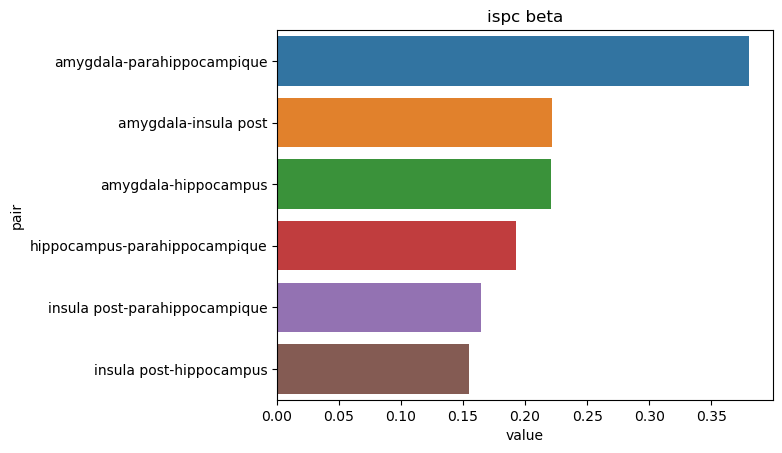

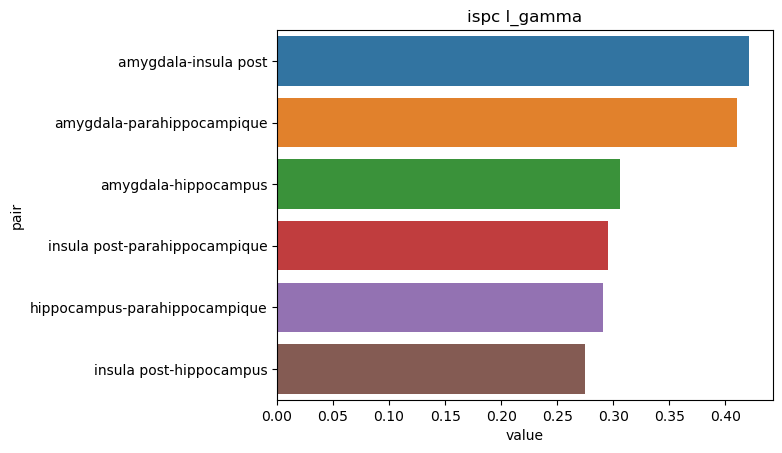

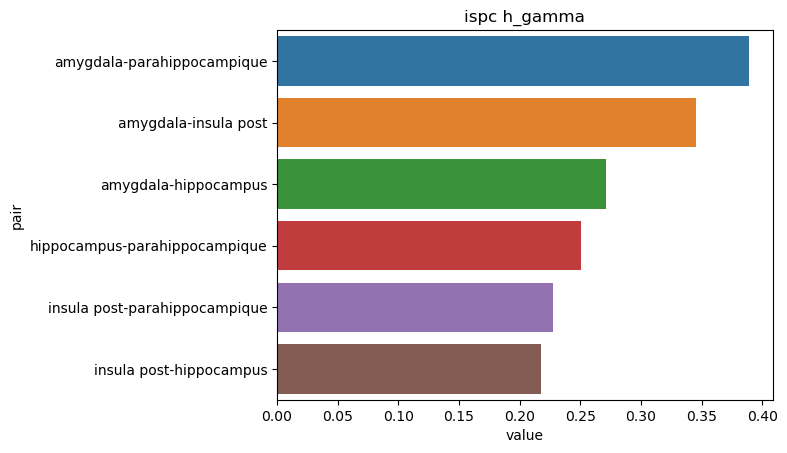

In [659]:
for band in df_raw_DFC_all['band'].unique():
    df = df_raw_DFC_all.query(f"metric == 'ispc' and phase in ['SNIFF_pre', 'SNIFF_resp_evnmt', 'SNIFF_post'] and band == '{band}'")
    df = clean_df_dfc(df).groupby('pair').mean().sort_values(by = 'value', ascending = False).reset_index()
    sns.barplot(data=df, x='value', y='pair', orient = 'h')
    plt.title(f'ispc {band}')
    plt.show()